# 人脸生成（Face Generation）
在该项目中，你将使用生成式对抗网络（Generative Adversarial Nets）来生成新的人脸图像。
### 获取数据
该项目将使用以下数据集：
- MNIST
- CelebA

由于 CelebA 数据集比较复杂，而且这是你第一次使用 GANs。我们想让你先在 MNIST 数据集上测试你的 GANs 模型，以让你更快的评估所建立模型的性能。

如果你在使用 [FloydHub](https://www.floydhub.com/), 请将 `data_dir` 设置为 "/input" 并使用 [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = '/data'
!pip install matplotlib==2.0.2
# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

    100% |████████████████████████████████| 14.6MB 46kB/s  eta 0:00:01    79% |█████████████████████████▎      | 11.6MB 37.8MB/s eta 0:00:01
  Found existing installation: matplotlib 2.1.0
    Uninstalling matplotlib-2.1.0:
      Successfully uninstalled matplotlib-2.1.0
You are using pip version 9.0.1, however version 18.0 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
Found mnist Data
Found celeba Data


## 探索数据（Explore the Data）
### MNIST
[MNIST](http://yann.lecun.com/exdb/mnist/) 是一个手写数字的图像数据集。你可以更改 `show_n_images` 探索此数据集。

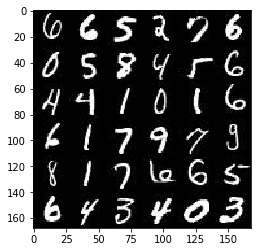

In [2]:
show_n_images = 36

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
[CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) 是一个包含 20 多万张名人图片及相关图片说明的数据集。你将用此数据集生成人脸，不会用不到相关说明。你可以更改 `show_n_images` 探索此数据集。

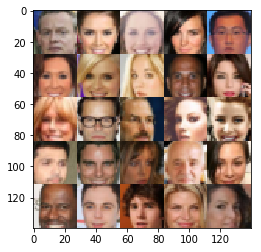

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## 预处理数据（Preprocess the Data）
由于该项目的重点是建立 GANs 模型，我们将为你预处理数据。

经过数据预处理，MNIST 和 CelebA 数据集的值在 28×28 维度图像的 [-0.5, 0.5] 范围内。CelebA 数据集中的图像裁剪了非脸部的图像部分，然后调整到 28x28 维度。

MNIST 数据集中的图像是单[通道](https://en.wikipedia.org/wiki/Channel_(digital_image%29)的黑白图像，CelebA 数据集中的图像是 [三通道的 RGB 彩色图像](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images)。

## 建立神经网络（Build the Neural Network）
你将通过部署以下函数来建立 GANs 的主要组成部分:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### 检查 TensorFlow 版本并获取 GPU 型号
检查你是否使用正确的 TensorFlow 版本，并获取 GPU 型号

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### 输入（Input）
部署 `model_inputs` 函数以创建用于神经网络的 [占位符 (TF Placeholders)](https://www.tensorflow.org/versions/r0.11/api_docs/python/io_ops/placeholders)。请创建以下占位符：
- 输入图像占位符: 使用 `image_width`，`image_height` 和 `image_channels` 设置为 rank 4。
- 输入 Z 占位符: 设置为 rank 2，并命名为 `z_dim`。
- 学习速率占位符: 设置为 rank 0。

返回占位符元组的形状为 (tensor of real input images, tensor of z data, learning rate)。


In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name="input_real")
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name="input_z")
    learning_rate = tf.placeholder(tf.float32, name="learning_rate")
                    

    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/opt/conda/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/opt/conda/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/opt/conda/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 478, in start\n    self.io_loop.start()', 'File "/opt/conda/lib/python3.6/site-packages/zmq/eventloop/ioloop.py", line 177, in start\n    super(ZMQIOLoop, self).start()', 'File "/opt/co

### 辨别器（Discriminator）
部署 `discriminator` 函数创建辨别器神经网络以辨别 `images`。该函数应能够重复使用神经网络中的各种变量。 在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "discriminator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回形如 (tensor output of the discriminator, tensor logits of the discriminator) 的元组。

In [6]:
def discriminator(images, reuse=False, alpha=0.2, keep_prob=0.7):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope("discriminator", reuse=reuse):
        #
        x1 = tf.layers.conv2d(images, 128, 4, strides=2, 
                              kernel_initializer=tf.contrib.layers.xavier_initializer(),
                              padding="same")
        x1 = tf.maximum(x1*alpha, x1)
        x1 = tf.nn.dropout(x1, keep_prob)
        #
        x2 = tf.layers.conv2d(x1, 256, 4, strides=2, 
                              kernel_initializer=tf.contrib.layers.xavier_initializer(),
                              padding="same")
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(x2*alpha, x2)
        x2 =tf.nn.dropout(x2, keep_prob)
        
        flat = tf.reshape(x2, (-1, 7*7*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)       

        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### 生成器（Generator）
部署 `generator` 函数以使用 `z` 生成图像。该函数应能够重复使用神经网络中的各种变量。
在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "generator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回所生成的 28 x 28 x `out_channel_dim` 维度图像。

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2, keep_prob=0.7):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope("generator", reuse=not is_train):
        #
        x1 = tf.layers.dense(z, 4*4*512)
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha*x1, x1)
        x1 = tf.nn.dropout(x1, keep_prob)
        #
        x2 = tf.layers.conv2d_transpose(x1, 256, 4, strides=2, 
                                        #kernel_initializer=tf.contrib.layers.xavier_initializer(),
                                        padding="same")
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha*x2, x2)
        x2 = tf.nn.dropout(x2, keep_prob)
        #
        x3 = tf.layers.conv2d_transpose(x2, 128, 4, strides=2, 
                                        #kernel_initializer=tf.contrib.layers.xavier_initializer(),
                                        padding="same")
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha*x3, x3)
        x3 = tf.nn.dropout(x3, keep_prob)
        #
        x4 = tf.layers.conv2d(x3, 64, 3, strides=1, 
                              #kernel_initializer=tf.contrib.layers.xavier_initializer(),
                              padding="valid")
        x4 = tf.layers.batch_normalization(x4, training=True)
        x4 = tf.maximum(x4*alpha, x4)
        x4 = tf.nn.dropout(x4, keep_prob)
    
        
        # Output layer, 28x28
        logits = tf.layers.conv2d_transpose(x4, out_channel_dim, 4, strides=2, padding="same")
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### 损失函数（Loss）
部署 `model_loss` 函数训练并计算 GANs 的损失。该函数应返回形如 (discriminator loss, generator loss) 的元组。

使用你已实现的函数：
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2, smooth=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                                                labels=tf.ones_like(d_model_real)*(1-smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### 优化（Optimization）
部署 `model_opt` 函数实现对 GANs 的优化。使用 [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) 获取可训练的所有变量。通过变量空间名 `discriminator` 和 `generator` 来过滤变量。该函数应返回形如 (discriminator training operation, generator training operation) 的元组。

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## 训练神经网络（Neural Network Training）
### 输出显示
使用该函数可以显示生成器 (Generator) 在训练过程中的当前输出，这会帮你评估 GANs 模型的训练程度。

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1] #input_z.shape[1]#
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### 训练
部署 `train` 函数以建立并训练 GANs 模型。记得使用以下你已完成的函数：
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

使用 `show_generator_output` 函数显示 `generator` 在训练过程中的输出。

**注意**：在每个批次 (batch) 中运行 `show_generator_output` 函数会显著增加训练时间与该 notebook 的体积。推荐每 100 批次输出一次 `generator` 的输出。 

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    #tf.reset_default_graph()
    inputs_real, inputs_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(inputs_real, inputs_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                batch_images *= 2
                steps += 1
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                _ = sess.run(d_train_opt, 
                             feed_dict={inputs_real: batch_images, inputs_z: batch_z, lr: learning_rate})
                _ = sess.run(g_train_opt, 
                             feed_dict={inputs_z: batch_z, inputs_real: batch_images, lr: learning_rate})
                
                if steps % 20 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({inputs_z: batch_z, inputs_real: batch_images})
                    train_loss_g = g_loss.eval({inputs_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                
                
                if steps % 100 == 0:
                    show_generator_output(sess, 25, inputs_z, data_shape[3], data_image_mode)
                
                

### MNIST
在 MNIST 上测试你的 GANs 模型。经过 2 次迭代，GANs 应该能够生成类似手写数字的图像。确保生成器 (generator) 低于辨别器 (discriminator) 的损失，或接近 0。

Epoch 1/2... Discriminator Loss: 0.6863... Generator Loss: 1.9415
Epoch 1/2... Discriminator Loss: 0.6107... Generator Loss: 2.0484
Epoch 1/2... Discriminator Loss: 0.9892... Generator Loss: 1.0799
Epoch 1/2... Discriminator Loss: 1.0115... Generator Loss: 1.0215
Epoch 1/2... Discriminator Loss: 0.8936... Generator Loss: 2.3837


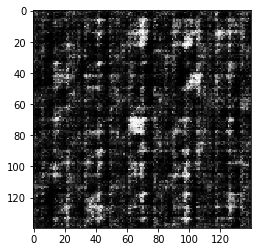

Epoch 1/2... Discriminator Loss: 0.7336... Generator Loss: 1.7431
Epoch 1/2... Discriminator Loss: 0.8626... Generator Loss: 4.1271
Epoch 1/2... Discriminator Loss: 1.1126... Generator Loss: 0.9895
Epoch 1/2... Discriminator Loss: 0.8810... Generator Loss: 1.5611
Epoch 1/2... Discriminator Loss: 0.8028... Generator Loss: 2.6583


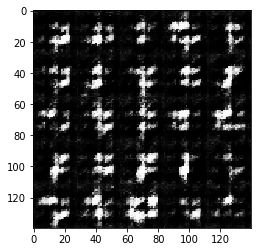

Epoch 1/2... Discriminator Loss: 1.1727... Generator Loss: 0.7792
Epoch 1/2... Discriminator Loss: 1.4131... Generator Loss: 0.6601
Epoch 1/2... Discriminator Loss: 1.1516... Generator Loss: 0.7679
Epoch 1/2... Discriminator Loss: 1.0045... Generator Loss: 1.4359
Epoch 1/2... Discriminator Loss: 0.7463... Generator Loss: 1.8890


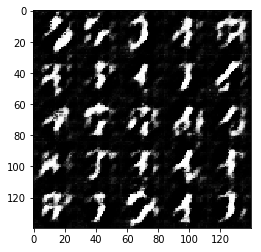

Epoch 1/2... Discriminator Loss: 0.7883... Generator Loss: 2.4265
Epoch 1/2... Discriminator Loss: 1.0869... Generator Loss: 0.9740
Epoch 1/2... Discriminator Loss: 0.7439... Generator Loss: 2.4735
Epoch 1/2... Discriminator Loss: 1.5599... Generator Loss: 0.5010
Epoch 1/2... Discriminator Loss: 0.7467... Generator Loss: 1.4964


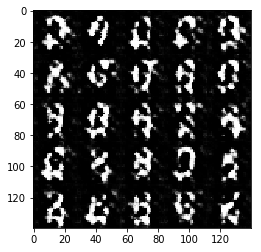

Epoch 1/2... Discriminator Loss: 1.0533... Generator Loss: 2.1889
Epoch 1/2... Discriminator Loss: 0.8438... Generator Loss: 2.1452
Epoch 1/2... Discriminator Loss: 1.5498... Generator Loss: 0.5528
Epoch 1/2... Discriminator Loss: 1.1760... Generator Loss: 1.7106
Epoch 1/2... Discriminator Loss: 0.7906... Generator Loss: 1.0672


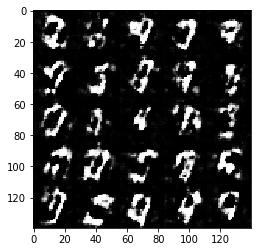

Epoch 1/2... Discriminator Loss: 1.1422... Generator Loss: 0.8573
Epoch 1/2... Discriminator Loss: 1.3212... Generator Loss: 0.8669
Epoch 1/2... Discriminator Loss: 0.9957... Generator Loss: 1.0130
Epoch 1/2... Discriminator Loss: 1.0504... Generator Loss: 0.8121
Epoch 1/2... Discriminator Loss: 1.0628... Generator Loss: 2.2155


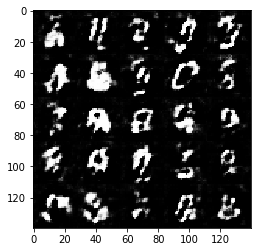

Epoch 1/2... Discriminator Loss: 1.3990... Generator Loss: 0.6274
Epoch 1/2... Discriminator Loss: 0.8341... Generator Loss: 1.4663
Epoch 1/2... Discriminator Loss: 1.3508... Generator Loss: 1.7261
Epoch 1/2... Discriminator Loss: 0.9512... Generator Loss: 1.7082
Epoch 1/2... Discriminator Loss: 0.9977... Generator Loss: 1.7589


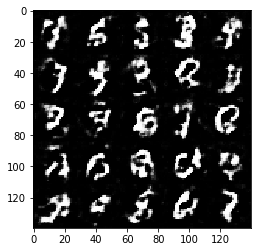

Epoch 1/2... Discriminator Loss: 1.2673... Generator Loss: 1.4264
Epoch 1/2... Discriminator Loss: 0.9009... Generator Loss: 0.9659
Epoch 1/2... Discriminator Loss: 1.1219... Generator Loss: 0.9137
Epoch 1/2... Discriminator Loss: 0.9245... Generator Loss: 1.5481
Epoch 1/2... Discriminator Loss: 1.1964... Generator Loss: 1.0665


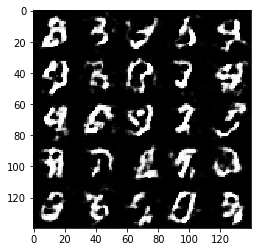

Epoch 1/2... Discriminator Loss: 0.8657... Generator Loss: 1.6928
Epoch 1/2... Discriminator Loss: 1.0606... Generator Loss: 1.3200
Epoch 1/2... Discriminator Loss: 1.2676... Generator Loss: 2.9193
Epoch 1/2... Discriminator Loss: 0.9953... Generator Loss: 1.3378
Epoch 1/2... Discriminator Loss: 1.1738... Generator Loss: 0.7523


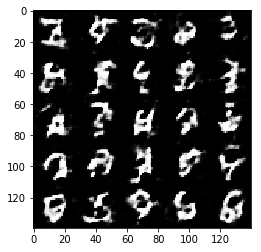

Epoch 1/2... Discriminator Loss: 0.9668... Generator Loss: 2.1296
Epoch 1/2... Discriminator Loss: 1.1042... Generator Loss: 1.7684
Epoch 1/2... Discriminator Loss: 1.0241... Generator Loss: 1.9204
Epoch 1/2... Discriminator Loss: 1.0277... Generator Loss: 1.8100
Epoch 1/2... Discriminator Loss: 1.3767... Generator Loss: 0.6052


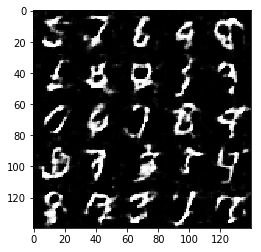

Epoch 1/2... Discriminator Loss: 1.0738... Generator Loss: 1.5598
Epoch 1/2... Discriminator Loss: 1.2873... Generator Loss: 1.9110
Epoch 1/2... Discriminator Loss: 0.9586... Generator Loss: 1.7361
Epoch 1/2... Discriminator Loss: 1.1541... Generator Loss: 1.4464
Epoch 1/2... Discriminator Loss: 1.1491... Generator Loss: 0.9181


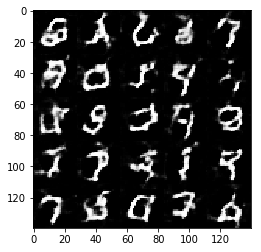

Epoch 1/2... Discriminator Loss: 0.8935... Generator Loss: 1.7218
Epoch 1/2... Discriminator Loss: 1.2061... Generator Loss: 0.6887
Epoch 1/2... Discriminator Loss: 1.2451... Generator Loss: 1.4137
Epoch 1/2... Discriminator Loss: 1.0761... Generator Loss: 1.2700
Epoch 1/2... Discriminator Loss: 0.9899... Generator Loss: 1.6656


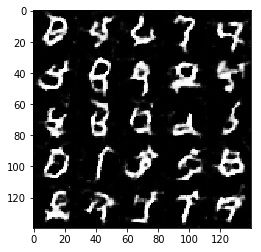

Epoch 1/2... Discriminator Loss: 0.9569... Generator Loss: 1.2732
Epoch 1/2... Discriminator Loss: 1.1880... Generator Loss: 0.7008
Epoch 1/2... Discriminator Loss: 1.3506... Generator Loss: 0.5795
Epoch 1/2... Discriminator Loss: 1.1757... Generator Loss: 1.2269
Epoch 1/2... Discriminator Loss: 1.1870... Generator Loss: 2.1691


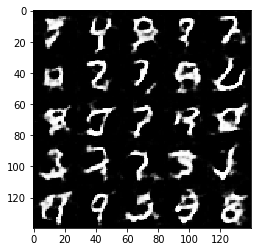

Epoch 1/2... Discriminator Loss: 1.1062... Generator Loss: 0.7435
Epoch 1/2... Discriminator Loss: 1.0506... Generator Loss: 1.7955
Epoch 1/2... Discriminator Loss: 1.1435... Generator Loss: 0.7973
Epoch 1/2... Discriminator Loss: 1.1230... Generator Loss: 1.3402
Epoch 1/2... Discriminator Loss: 1.2115... Generator Loss: 1.8144


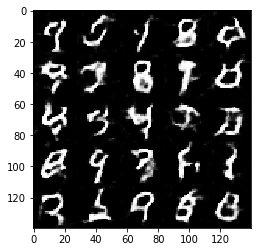

Epoch 1/2... Discriminator Loss: 1.2213... Generator Loss: 1.1876
Epoch 1/2... Discriminator Loss: 1.2752... Generator Loss: 1.9527
Epoch 1/2... Discriminator Loss: 1.4223... Generator Loss: 0.6632
Epoch 1/2... Discriminator Loss: 1.2778... Generator Loss: 1.0533
Epoch 1/2... Discriminator Loss: 1.2127... Generator Loss: 1.2775


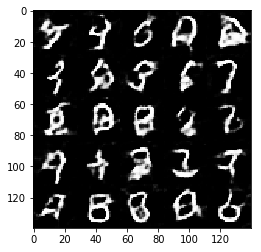

Epoch 1/2... Discriminator Loss: 1.1655... Generator Loss: 0.7704
Epoch 1/2... Discriminator Loss: 1.2615... Generator Loss: 0.8769
Epoch 1/2... Discriminator Loss: 1.1333... Generator Loss: 1.4253
Epoch 1/2... Discriminator Loss: 1.2837... Generator Loss: 1.7447
Epoch 1/2... Discriminator Loss: 1.0612... Generator Loss: 0.9788


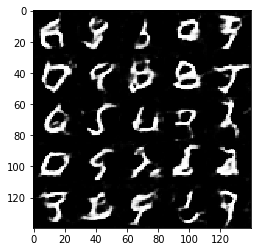

Epoch 1/2... Discriminator Loss: 1.5159... Generator Loss: 0.4524
Epoch 1/2... Discriminator Loss: 1.2058... Generator Loss: 1.4062
Epoch 1/2... Discriminator Loss: 1.0494... Generator Loss: 1.4028
Epoch 1/2... Discriminator Loss: 1.0819... Generator Loss: 1.2505
Epoch 1/2... Discriminator Loss: 1.1369... Generator Loss: 1.0261


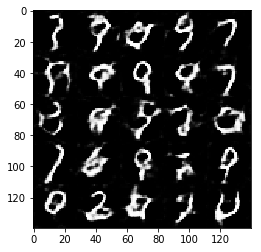

Epoch 1/2... Discriminator Loss: 1.2013... Generator Loss: 1.1451
Epoch 1/2... Discriminator Loss: 1.0459... Generator Loss: 1.4223
Epoch 1/2... Discriminator Loss: 1.1792... Generator Loss: 2.0587
Epoch 1/2... Discriminator Loss: 1.2552... Generator Loss: 0.8014
Epoch 1/2... Discriminator Loss: 1.1862... Generator Loss: 1.2857


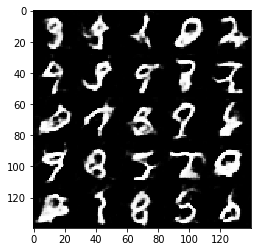

Epoch 1/2... Discriminator Loss: 1.0820... Generator Loss: 1.9044
Epoch 1/2... Discriminator Loss: 1.1613... Generator Loss: 1.7490
Epoch 1/2... Discriminator Loss: 1.2538... Generator Loss: 0.9560
Epoch 2/2... Discriminator Loss: 1.3046... Generator Loss: 1.3947
Epoch 2/2... Discriminator Loss: 1.1840... Generator Loss: 1.5670


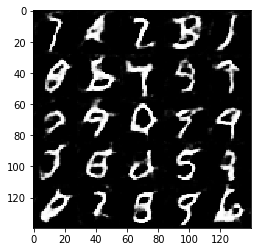

Epoch 2/2... Discriminator Loss: 1.2439... Generator Loss: 1.2702
Epoch 2/2... Discriminator Loss: 1.2593... Generator Loss: 1.1444
Epoch 2/2... Discriminator Loss: 1.3803... Generator Loss: 0.7516
Epoch 2/2... Discriminator Loss: 1.0202... Generator Loss: 1.0240
Epoch 2/2... Discriminator Loss: 1.1973... Generator Loss: 1.0075


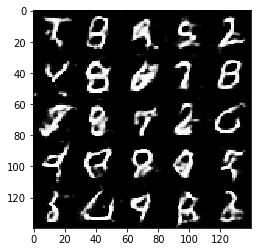

Epoch 2/2... Discriminator Loss: 0.9243... Generator Loss: 0.8568
Epoch 2/2... Discriminator Loss: 1.2606... Generator Loss: 0.8676
Epoch 2/2... Discriminator Loss: 1.1333... Generator Loss: 0.9418
Epoch 2/2... Discriminator Loss: 1.1639... Generator Loss: 0.7751
Epoch 2/2... Discriminator Loss: 1.2339... Generator Loss: 0.9512


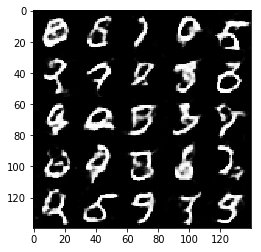

Epoch 2/2... Discriminator Loss: 1.1206... Generator Loss: 0.9438
Epoch 2/2... Discriminator Loss: 1.1650... Generator Loss: 1.4879
Epoch 2/2... Discriminator Loss: 1.1427... Generator Loss: 0.8678
Epoch 2/2... Discriminator Loss: 1.1955... Generator Loss: 0.7936
Epoch 2/2... Discriminator Loss: 1.1721... Generator Loss: 1.0147


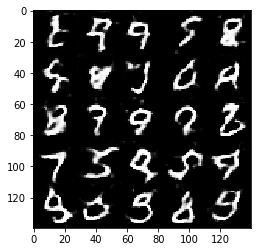

Epoch 2/2... Discriminator Loss: 1.3653... Generator Loss: 0.7513
Epoch 2/2... Discriminator Loss: 1.1709... Generator Loss: 0.9081
Epoch 2/2... Discriminator Loss: 0.9790... Generator Loss: 1.0337
Epoch 2/2... Discriminator Loss: 1.2122... Generator Loss: 1.7925
Epoch 2/2... Discriminator Loss: 1.1219... Generator Loss: 0.8893


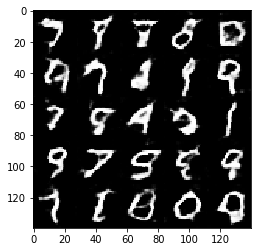

Epoch 2/2... Discriminator Loss: 1.1130... Generator Loss: 1.0521
Epoch 2/2... Discriminator Loss: 1.0002... Generator Loss: 1.1904
Epoch 2/2... Discriminator Loss: 1.0743... Generator Loss: 0.9460
Epoch 2/2... Discriminator Loss: 1.1728... Generator Loss: 1.4229
Epoch 2/2... Discriminator Loss: 1.2027... Generator Loss: 1.3615


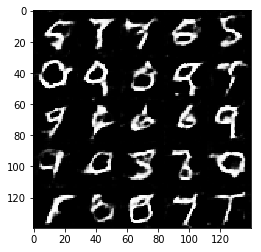

Epoch 2/2... Discriminator Loss: 1.1723... Generator Loss: 1.0478
Epoch 2/2... Discriminator Loss: 1.0448... Generator Loss: 1.1059
Epoch 2/2... Discriminator Loss: 1.1042... Generator Loss: 0.9396
Epoch 2/2... Discriminator Loss: 1.3229... Generator Loss: 0.9497
Epoch 2/2... Discriminator Loss: 1.1955... Generator Loss: 1.4005


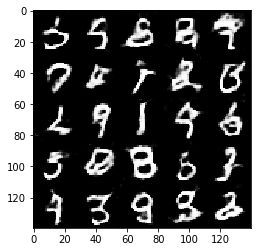

Epoch 2/2... Discriminator Loss: 1.2295... Generator Loss: 1.4393
Epoch 2/2... Discriminator Loss: 1.1034... Generator Loss: 1.0548
Epoch 2/2... Discriminator Loss: 0.9802... Generator Loss: 1.1397
Epoch 2/2... Discriminator Loss: 1.4597... Generator Loss: 0.8556
Epoch 2/2... Discriminator Loss: 1.1772... Generator Loss: 1.2115


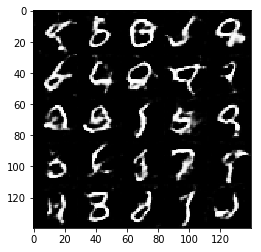

Epoch 2/2... Discriminator Loss: 1.3436... Generator Loss: 0.8005
Epoch 2/2... Discriminator Loss: 1.3774... Generator Loss: 1.3181
Epoch 2/2... Discriminator Loss: 1.1101... Generator Loss: 0.8788
Epoch 2/2... Discriminator Loss: 1.1436... Generator Loss: 0.9047
Epoch 2/2... Discriminator Loss: 1.0778... Generator Loss: 1.4888


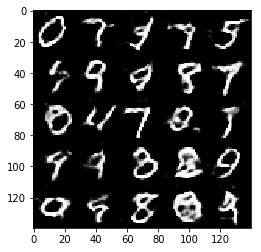

Epoch 2/2... Discriminator Loss: 1.2145... Generator Loss: 1.6170
Epoch 2/2... Discriminator Loss: 1.1929... Generator Loss: 1.3807
Epoch 2/2... Discriminator Loss: 1.0087... Generator Loss: 1.2884
Epoch 2/2... Discriminator Loss: 1.1601... Generator Loss: 0.7911
Epoch 2/2... Discriminator Loss: 1.2767... Generator Loss: 0.8318


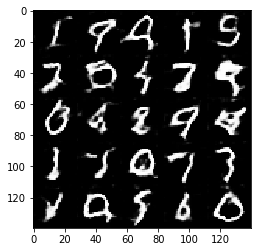

Epoch 2/2... Discriminator Loss: 1.2609... Generator Loss: 1.6041
Epoch 2/2... Discriminator Loss: 0.9428... Generator Loss: 1.3816
Epoch 2/2... Discriminator Loss: 1.1052... Generator Loss: 1.2661
Epoch 2/2... Discriminator Loss: 1.2219... Generator Loss: 1.2522
Epoch 2/2... Discriminator Loss: 1.1104... Generator Loss: 1.2123


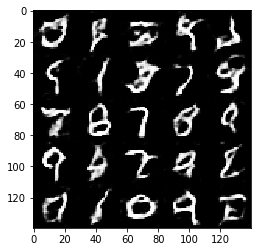

Epoch 2/2... Discriminator Loss: 0.9681... Generator Loss: 1.0581
Epoch 2/2... Discriminator Loss: 1.0985... Generator Loss: 1.3495
Epoch 2/2... Discriminator Loss: 1.0582... Generator Loss: 1.1176
Epoch 2/2... Discriminator Loss: 1.0547... Generator Loss: 0.9965
Epoch 2/2... Discriminator Loss: 1.1253... Generator Loss: 1.2683


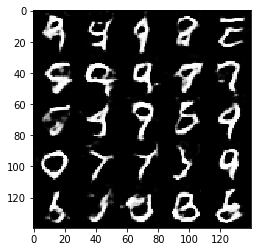

Epoch 2/2... Discriminator Loss: 1.1126... Generator Loss: 1.0475
Epoch 2/2... Discriminator Loss: 1.2216... Generator Loss: 1.8431
Epoch 2/2... Discriminator Loss: 1.4810... Generator Loss: 2.8159
Epoch 2/2... Discriminator Loss: 1.2016... Generator Loss: 0.7204
Epoch 2/2... Discriminator Loss: 1.3509... Generator Loss: 2.3521


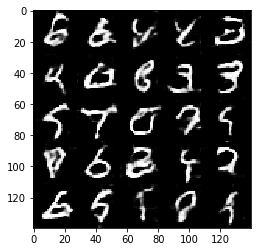

Epoch 2/2... Discriminator Loss: 0.9681... Generator Loss: 1.1553
Epoch 2/2... Discriminator Loss: 0.9682... Generator Loss: 1.1725
Epoch 2/2... Discriminator Loss: 1.2084... Generator Loss: 1.1027
Epoch 2/2... Discriminator Loss: 0.9159... Generator Loss: 1.2448
Epoch 2/2... Discriminator Loss: 1.1192... Generator Loss: 1.5843


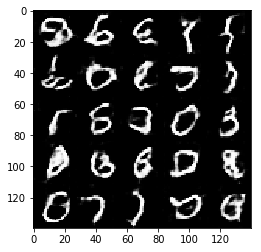

Epoch 2/2... Discriminator Loss: 1.0373... Generator Loss: 1.4634
Epoch 2/2... Discriminator Loss: 1.0801... Generator Loss: 0.9737
Epoch 2/2... Discriminator Loss: 1.0978... Generator Loss: 1.9425
Epoch 2/2... Discriminator Loss: 1.1458... Generator Loss: 0.7855
Epoch 2/2... Discriminator Loss: 1.2775... Generator Loss: 0.6741


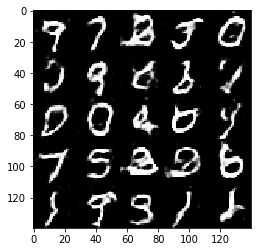

Epoch 2/2... Discriminator Loss: 0.9243... Generator Loss: 1.5642
Epoch 2/2... Discriminator Loss: 0.9975... Generator Loss: 1.4184
Epoch 2/2... Discriminator Loss: 1.0863... Generator Loss: 0.9701
Epoch 2/2... Discriminator Loss: 1.0102... Generator Loss: 0.9613
Epoch 2/2... Discriminator Loss: 1.1239... Generator Loss: 2.1966


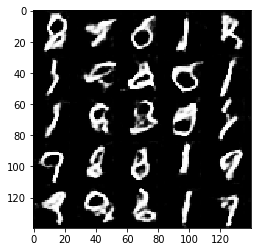

Epoch 2/2... Discriminator Loss: 1.2437... Generator Loss: 1.2690
Epoch 2/2... Discriminator Loss: 1.0537... Generator Loss: 1.0679
Epoch 2/2... Discriminator Loss: 1.2632... Generator Loss: 0.6663
Epoch 2/2... Discriminator Loss: 1.0390... Generator Loss: 1.3760
Epoch 2/2... Discriminator Loss: 1.2569... Generator Loss: 1.7116


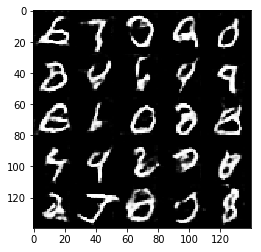

Epoch 2/2... Discriminator Loss: 1.1862... Generator Loss: 0.8036
Epoch 2/2... Discriminator Loss: 1.0523... Generator Loss: 1.9313
Epoch 2/2... Discriminator Loss: 1.2022... Generator Loss: 0.7968
Epoch 2/2... Discriminator Loss: 1.2642... Generator Loss: 1.8369
Epoch 2/2... Discriminator Loss: 1.1796... Generator Loss: 1.6212


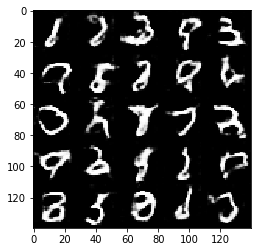

Epoch 2/2... Discriminator Loss: 1.1537... Generator Loss: 0.8543
Epoch 2/2... Discriminator Loss: 0.9685... Generator Loss: 0.8609
Epoch 2/2... Discriminator Loss: 1.0635... Generator Loss: 1.4520
Epoch 2/2... Discriminator Loss: 1.2872... Generator Loss: 1.6370
Epoch 2/2... Discriminator Loss: 1.1910... Generator Loss: 0.7875


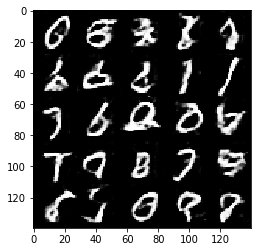

Epoch 2/2... Discriminator Loss: 1.1886... Generator Loss: 1.4056
Epoch 2/2... Discriminator Loss: 1.0020... Generator Loss: 1.1755


In [12]:
batch_size = 32
z_dim = 150
learning_rate = 0.0002
beta1 = 0.15


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
在 CelebA 上运行你的 GANs 模型。在一般的GPU上运行每次迭代大约需要 20 分钟。你可以运行整个迭代，或者当 GANs 开始产生真实人脸图像时停止它。

Epoch 1/1... Discriminator Loss: 0.6610... Generator Loss: 2.0902
Epoch 1/1... Discriminator Loss: 0.4933... Generator Loss: 2.9577
Epoch 1/1... Discriminator Loss: 0.5549... Generator Loss: 3.0732
Epoch 1/1... Discriminator Loss: 0.7206... Generator Loss: 2.0621
Epoch 1/1... Discriminator Loss: 1.1557... Generator Loss: 1.0624


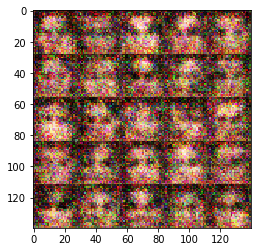

Epoch 1/1... Discriminator Loss: 0.7201... Generator Loss: 3.4646
Epoch 1/1... Discriminator Loss: 0.5494... Generator Loss: 2.2548
Epoch 1/1... Discriminator Loss: 0.7059... Generator Loss: 2.2797
Epoch 1/1... Discriminator Loss: 0.7483... Generator Loss: 1.2232
Epoch 1/1... Discriminator Loss: 0.7195... Generator Loss: 1.3259


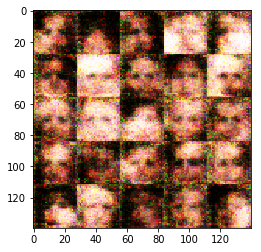

Epoch 1/1... Discriminator Loss: 0.6728... Generator Loss: 2.2504
Epoch 1/1... Discriminator Loss: 0.6394... Generator Loss: 1.9325
Epoch 1/1... Discriminator Loss: 0.5257... Generator Loss: 2.4952
Epoch 1/1... Discriminator Loss: 0.5567... Generator Loss: 1.8950
Epoch 1/1... Discriminator Loss: 0.5805... Generator Loss: 2.2606


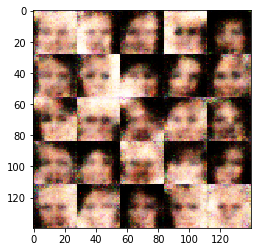

Epoch 1/1... Discriminator Loss: 0.6088... Generator Loss: 2.4499
Epoch 1/1... Discriminator Loss: 0.6150... Generator Loss: 1.9674
Epoch 1/1... Discriminator Loss: 0.6556... Generator Loss: 3.3804
Epoch 1/1... Discriminator Loss: 0.5317... Generator Loss: 2.4571
Epoch 1/1... Discriminator Loss: 0.5072... Generator Loss: 2.6696


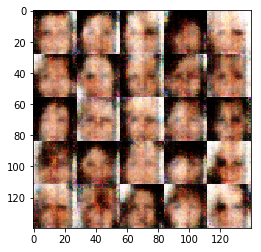

Epoch 1/1... Discriminator Loss: 1.3332... Generator Loss: 5.0994
Epoch 1/1... Discriminator Loss: 0.6973... Generator Loss: 2.5411
Epoch 1/1... Discriminator Loss: 0.6326... Generator Loss: 1.4662
Epoch 1/1... Discriminator Loss: 0.8897... Generator Loss: 3.7398
Epoch 1/1... Discriminator Loss: 1.2725... Generator Loss: 3.9107


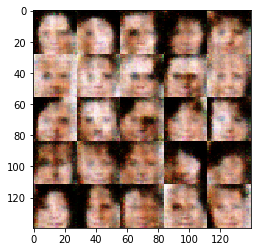

Epoch 1/1... Discriminator Loss: 0.7900... Generator Loss: 2.9005
Epoch 1/1... Discriminator Loss: 0.7255... Generator Loss: 1.8067
Epoch 1/1... Discriminator Loss: 0.7894... Generator Loss: 2.4497
Epoch 1/1... Discriminator Loss: 0.7443... Generator Loss: 2.1331
Epoch 1/1... Discriminator Loss: 0.9559... Generator Loss: 1.1689


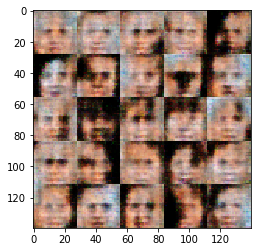

Epoch 1/1... Discriminator Loss: 0.6786... Generator Loss: 2.1634
Epoch 1/1... Discriminator Loss: 0.8709... Generator Loss: 1.1675
Epoch 1/1... Discriminator Loss: 0.7599... Generator Loss: 1.2160
Epoch 1/1... Discriminator Loss: 0.6589... Generator Loss: 1.4550
Epoch 1/1... Discriminator Loss: 1.1019... Generator Loss: 3.0812


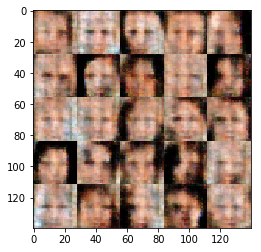

Epoch 1/1... Discriminator Loss: 0.7411... Generator Loss: 3.2799
Epoch 1/1... Discriminator Loss: 0.7473... Generator Loss: 1.3746
Epoch 1/1... Discriminator Loss: 0.7510... Generator Loss: 2.5068
Epoch 1/1... Discriminator Loss: 0.8238... Generator Loss: 2.5567
Epoch 1/1... Discriminator Loss: 0.9207... Generator Loss: 1.0930


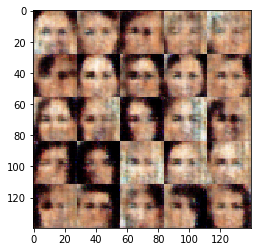

Epoch 1/1... Discriminator Loss: 0.5916... Generator Loss: 2.0186
Epoch 1/1... Discriminator Loss: 0.9143... Generator Loss: 1.0209
Epoch 1/1... Discriminator Loss: 0.9838... Generator Loss: 0.9761
Epoch 1/1... Discriminator Loss: 0.7642... Generator Loss: 1.6004
Epoch 1/1... Discriminator Loss: 0.9594... Generator Loss: 0.8634


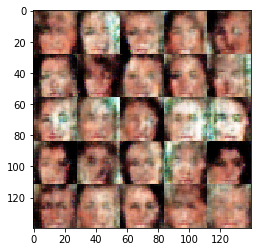

Epoch 1/1... Discriminator Loss: 0.8762... Generator Loss: 2.1391
Epoch 1/1... Discriminator Loss: 0.9249... Generator Loss: 2.9561
Epoch 1/1... Discriminator Loss: 0.7033... Generator Loss: 2.0711
Epoch 1/1... Discriminator Loss: 0.7606... Generator Loss: 1.5967
Epoch 1/1... Discriminator Loss: 0.7502... Generator Loss: 3.2399


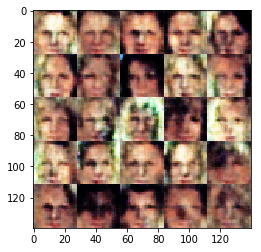

Epoch 1/1... Discriminator Loss: 0.7287... Generator Loss: 1.9695
Epoch 1/1... Discriminator Loss: 1.1438... Generator Loss: 0.7063
Epoch 1/1... Discriminator Loss: 0.7513... Generator Loss: 1.8954
Epoch 1/1... Discriminator Loss: 0.7751... Generator Loss: 1.6985
Epoch 1/1... Discriminator Loss: 0.6325... Generator Loss: 1.8872


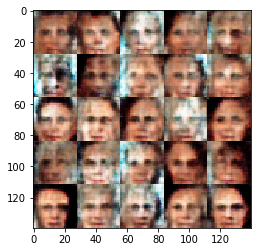

Epoch 1/1... Discriminator Loss: 0.7934... Generator Loss: 1.7345
Epoch 1/1... Discriminator Loss: 0.9558... Generator Loss: 0.9874
Epoch 1/1... Discriminator Loss: 1.1759... Generator Loss: 0.7546
Epoch 1/1... Discriminator Loss: 1.0663... Generator Loss: 1.0732
Epoch 1/1... Discriminator Loss: 0.8139... Generator Loss: 1.2792


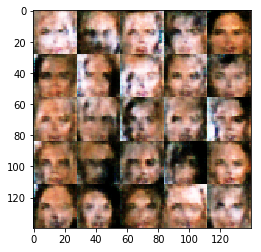

Epoch 1/1... Discriminator Loss: 0.7359... Generator Loss: 2.2612
Epoch 1/1... Discriminator Loss: 0.9900... Generator Loss: 1.1467
Epoch 1/1... Discriminator Loss: 0.9567... Generator Loss: 3.3409
Epoch 1/1... Discriminator Loss: 0.7173... Generator Loss: 1.7793
Epoch 1/1... Discriminator Loss: 0.8373... Generator Loss: 1.0987


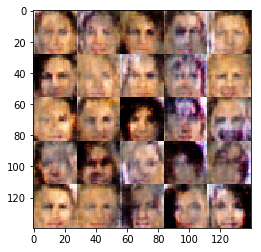

Epoch 1/1... Discriminator Loss: 0.6715... Generator Loss: 2.5303
Epoch 1/1... Discriminator Loss: 0.8772... Generator Loss: 2.0311
Epoch 1/1... Discriminator Loss: 0.6991... Generator Loss: 1.8586
Epoch 1/1... Discriminator Loss: 1.2226... Generator Loss: 0.8997
Epoch 1/1... Discriminator Loss: 0.8062... Generator Loss: 1.5317


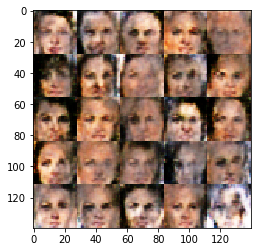

Epoch 1/1... Discriminator Loss: 0.8173... Generator Loss: 1.6004
Epoch 1/1... Discriminator Loss: 0.8740... Generator Loss: 0.9560
Epoch 1/1... Discriminator Loss: 1.3766... Generator Loss: 0.8052
Epoch 1/1... Discriminator Loss: 1.2600... Generator Loss: 0.7924
Epoch 1/1... Discriminator Loss: 0.7098... Generator Loss: 1.9264


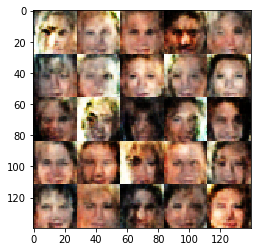

Epoch 1/1... Discriminator Loss: 0.8894... Generator Loss: 1.4091
Epoch 1/1... Discriminator Loss: 1.4341... Generator Loss: 1.8081
Epoch 1/1... Discriminator Loss: 0.9052... Generator Loss: 1.8216
Epoch 1/1... Discriminator Loss: 0.8764... Generator Loss: 1.8874
Epoch 1/1... Discriminator Loss: 0.9955... Generator Loss: 1.2738


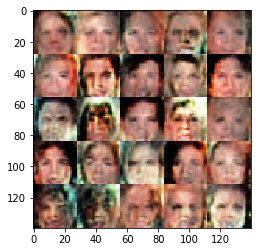

Epoch 1/1... Discriminator Loss: 1.1964... Generator Loss: 1.9721
Epoch 1/1... Discriminator Loss: 0.9219... Generator Loss: 2.1414
Epoch 1/1... Discriminator Loss: 1.1284... Generator Loss: 2.0451
Epoch 1/1... Discriminator Loss: 1.3961... Generator Loss: 1.7818
Epoch 1/1... Discriminator Loss: 0.9759... Generator Loss: 1.3964


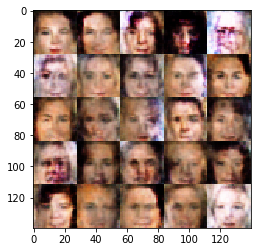

Epoch 1/1... Discriminator Loss: 0.9674... Generator Loss: 1.1115
Epoch 1/1... Discriminator Loss: 0.6825... Generator Loss: 1.4373
Epoch 1/1... Discriminator Loss: 0.9212... Generator Loss: 1.7803
Epoch 1/1... Discriminator Loss: 1.0508... Generator Loss: 1.0750
Epoch 1/1... Discriminator Loss: 1.0938... Generator Loss: 0.8227


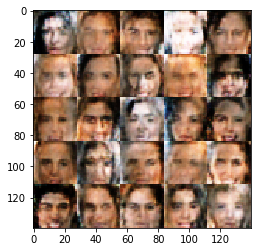

Epoch 1/1... Discriminator Loss: 0.8634... Generator Loss: 1.3287
Epoch 1/1... Discriminator Loss: 1.1532... Generator Loss: 1.0961
Epoch 1/1... Discriminator Loss: 1.0241... Generator Loss: 0.8564
Epoch 1/1... Discriminator Loss: 1.4375... Generator Loss: 2.4062
Epoch 1/1... Discriminator Loss: 0.9409... Generator Loss: 1.0326


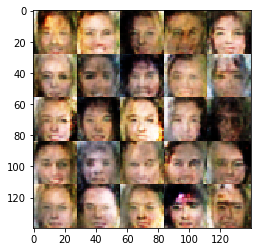

Epoch 1/1... Discriminator Loss: 1.1477... Generator Loss: 1.7829
Epoch 1/1... Discriminator Loss: 1.0495... Generator Loss: 1.3538
Epoch 1/1... Discriminator Loss: 1.1669... Generator Loss: 0.8626
Epoch 1/1... Discriminator Loss: 0.7845... Generator Loss: 1.3063
Epoch 1/1... Discriminator Loss: 0.9715... Generator Loss: 0.9586


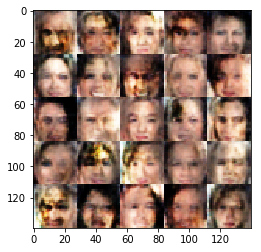

Epoch 1/1... Discriminator Loss: 1.3057... Generator Loss: 1.5195
Epoch 1/1... Discriminator Loss: 1.3315... Generator Loss: 0.8272
Epoch 1/1... Discriminator Loss: 1.1874... Generator Loss: 0.8761
Epoch 1/1... Discriminator Loss: 0.9720... Generator Loss: 1.3618
Epoch 1/1... Discriminator Loss: 1.0425... Generator Loss: 1.1027


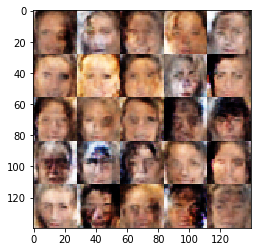

Epoch 1/1... Discriminator Loss: 1.0497... Generator Loss: 1.1801
Epoch 1/1... Discriminator Loss: 1.1590... Generator Loss: 1.0129
Epoch 1/1... Discriminator Loss: 1.0701... Generator Loss: 0.9460
Epoch 1/1... Discriminator Loss: 1.0849... Generator Loss: 1.8475
Epoch 1/1... Discriminator Loss: 1.0848... Generator Loss: 0.7760


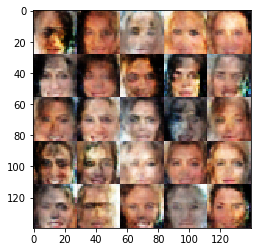

Epoch 1/1... Discriminator Loss: 0.9642... Generator Loss: 1.7491
Epoch 1/1... Discriminator Loss: 1.2586... Generator Loss: 0.6664
Epoch 1/1... Discriminator Loss: 1.1684... Generator Loss: 0.9543
Epoch 1/1... Discriminator Loss: 1.0800... Generator Loss: 1.1008
Epoch 1/1... Discriminator Loss: 1.1274... Generator Loss: 0.8542


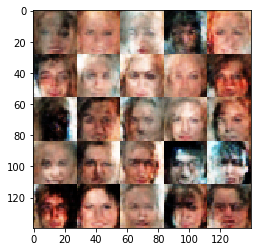

Epoch 1/1... Discriminator Loss: 1.1166... Generator Loss: 1.5001
Epoch 1/1... Discriminator Loss: 1.2849... Generator Loss: 1.8203
Epoch 1/1... Discriminator Loss: 0.9291... Generator Loss: 1.4309
Epoch 1/1... Discriminator Loss: 0.9424... Generator Loss: 1.2096
Epoch 1/1... Discriminator Loss: 0.9082... Generator Loss: 1.0859


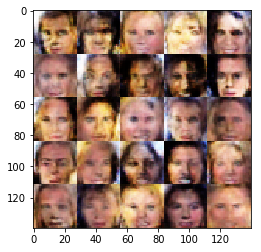

Epoch 1/1... Discriminator Loss: 1.2176... Generator Loss: 1.4106
Epoch 1/1... Discriminator Loss: 1.0182... Generator Loss: 1.3945
Epoch 1/1... Discriminator Loss: 1.1509... Generator Loss: 0.9508
Epoch 1/1... Discriminator Loss: 1.1264... Generator Loss: 1.6620
Epoch 1/1... Discriminator Loss: 1.4719... Generator Loss: 0.6744


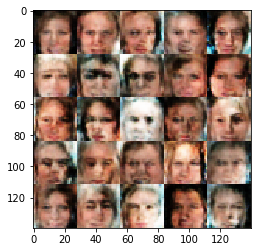

Epoch 1/1... Discriminator Loss: 1.3129... Generator Loss: 1.7629
Epoch 1/1... Discriminator Loss: 1.2133... Generator Loss: 1.0291
Epoch 1/1... Discriminator Loss: 1.2542... Generator Loss: 1.3268
Epoch 1/1... Discriminator Loss: 1.1496... Generator Loss: 1.0866
Epoch 1/1... Discriminator Loss: 1.1106... Generator Loss: 1.0875


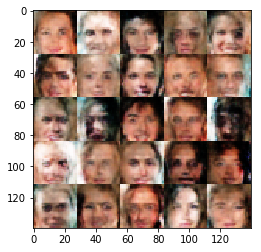

Epoch 1/1... Discriminator Loss: 1.0537... Generator Loss: 1.5954
Epoch 1/1... Discriminator Loss: 1.1829... Generator Loss: 1.1669
Epoch 1/1... Discriminator Loss: 1.4748... Generator Loss: 0.5062
Epoch 1/1... Discriminator Loss: 1.5431... Generator Loss: 0.5054
Epoch 1/1... Discriminator Loss: 1.0981... Generator Loss: 1.6082


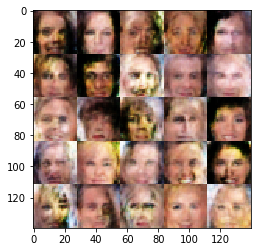

Epoch 1/1... Discriminator Loss: 1.5579... Generator Loss: 0.4954
Epoch 1/1... Discriminator Loss: 0.9958... Generator Loss: 0.9434
Epoch 1/1... Discriminator Loss: 0.9151... Generator Loss: 0.9426
Epoch 1/1... Discriminator Loss: 1.0453... Generator Loss: 1.6247
Epoch 1/1... Discriminator Loss: 0.9195... Generator Loss: 1.7684


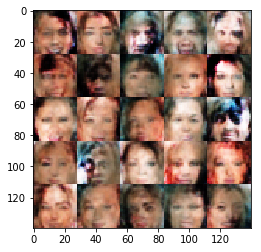

Epoch 1/1... Discriminator Loss: 1.0343... Generator Loss: 0.8945
Epoch 1/1... Discriminator Loss: 0.9550... Generator Loss: 1.0153
Epoch 1/1... Discriminator Loss: 1.0254... Generator Loss: 1.9324
Epoch 1/1... Discriminator Loss: 0.9626... Generator Loss: 1.6414
Epoch 1/1... Discriminator Loss: 1.0047... Generator Loss: 1.5767


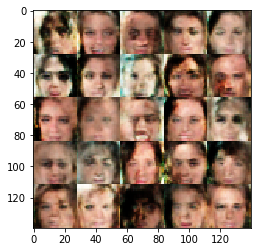

Epoch 1/1... Discriminator Loss: 1.3091... Generator Loss: 1.8948
Epoch 1/1... Discriminator Loss: 1.1039... Generator Loss: 0.9658
Epoch 1/1... Discriminator Loss: 1.2546... Generator Loss: 0.7298
Epoch 1/1... Discriminator Loss: 1.3277... Generator Loss: 0.9335
Epoch 1/1... Discriminator Loss: 0.9556... Generator Loss: 1.4231


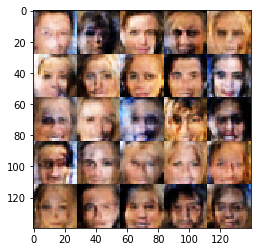

Epoch 1/1... Discriminator Loss: 1.2247... Generator Loss: 1.2234
Epoch 1/1... Discriminator Loss: 0.9790... Generator Loss: 1.1671
Epoch 1/1... Discriminator Loss: 0.9875... Generator Loss: 1.5730
Epoch 1/1... Discriminator Loss: 1.1398... Generator Loss: 1.2694
Epoch 1/1... Discriminator Loss: 1.1522... Generator Loss: 1.3986


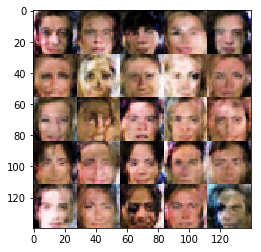

Epoch 1/1... Discriminator Loss: 1.0229... Generator Loss: 0.9922
Epoch 1/1... Discriminator Loss: 1.2921... Generator Loss: 0.9044
Epoch 1/1... Discriminator Loss: 1.0468... Generator Loss: 0.8629
Epoch 1/1... Discriminator Loss: 1.2492... Generator Loss: 1.5073
Epoch 1/1... Discriminator Loss: 1.0339... Generator Loss: 1.0309


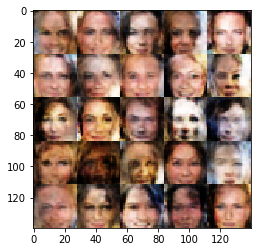

Epoch 1/1... Discriminator Loss: 1.2205... Generator Loss: 0.7823
Epoch 1/1... Discriminator Loss: 1.1472... Generator Loss: 0.8969
Epoch 1/1... Discriminator Loss: 1.0568... Generator Loss: 1.6103
Epoch 1/1... Discriminator Loss: 1.1180... Generator Loss: 1.3594
Epoch 1/1... Discriminator Loss: 1.0393... Generator Loss: 1.7099


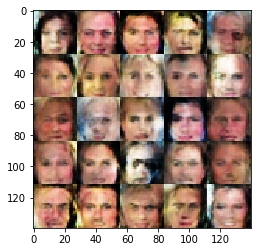

Epoch 1/1... Discriminator Loss: 1.3653... Generator Loss: 1.4866
Epoch 1/1... Discriminator Loss: 1.2453... Generator Loss: 1.5687
Epoch 1/1... Discriminator Loss: 1.1337... Generator Loss: 1.1125
Epoch 1/1... Discriminator Loss: 1.1790... Generator Loss: 0.9209
Epoch 1/1... Discriminator Loss: 1.0158... Generator Loss: 1.3103


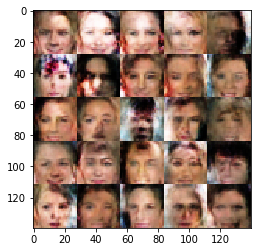

Epoch 1/1... Discriminator Loss: 0.9958... Generator Loss: 1.2122
Epoch 1/1... Discriminator Loss: 1.1991... Generator Loss: 1.4764
Epoch 1/1... Discriminator Loss: 0.8446... Generator Loss: 1.2758
Epoch 1/1... Discriminator Loss: 1.2444... Generator Loss: 1.0855
Epoch 1/1... Discriminator Loss: 0.9328... Generator Loss: 1.3885


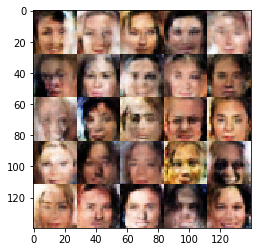

Epoch 1/1... Discriminator Loss: 0.9764... Generator Loss: 1.3461
Epoch 1/1... Discriminator Loss: 1.1521... Generator Loss: 1.1075
Epoch 1/1... Discriminator Loss: 1.2257... Generator Loss: 0.8536
Epoch 1/1... Discriminator Loss: 1.2936... Generator Loss: 1.5214
Epoch 1/1... Discriminator Loss: 1.0532... Generator Loss: 1.4694


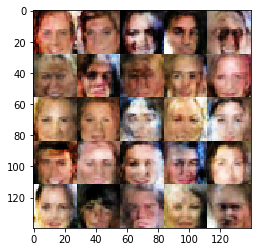

Epoch 1/1... Discriminator Loss: 0.9046... Generator Loss: 1.0221
Epoch 1/1... Discriminator Loss: 1.1789... Generator Loss: 1.2679
Epoch 1/1... Discriminator Loss: 1.1465... Generator Loss: 0.8258
Epoch 1/1... Discriminator Loss: 1.1652... Generator Loss: 0.7627
Epoch 1/1... Discriminator Loss: 0.9872... Generator Loss: 1.1920


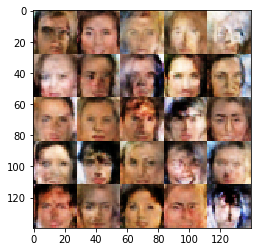

Epoch 1/1... Discriminator Loss: 1.3037... Generator Loss: 0.6661
Epoch 1/1... Discriminator Loss: 1.0009... Generator Loss: 1.0157
Epoch 1/1... Discriminator Loss: 1.1217... Generator Loss: 1.0015
Epoch 1/1... Discriminator Loss: 1.1950... Generator Loss: 1.1108
Epoch 1/1... Discriminator Loss: 1.2022... Generator Loss: 0.8521


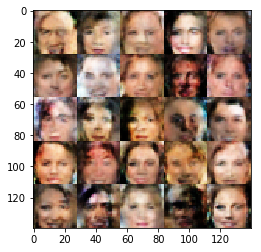

Epoch 1/1... Discriminator Loss: 1.0665... Generator Loss: 1.2447
Epoch 1/1... Discriminator Loss: 1.1171... Generator Loss: 1.2280
Epoch 1/1... Discriminator Loss: 1.2441... Generator Loss: 0.8435
Epoch 1/1... Discriminator Loss: 1.1921... Generator Loss: 1.2761
Epoch 1/1... Discriminator Loss: 1.2231... Generator Loss: 1.0047


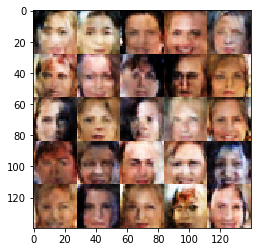

Epoch 1/1... Discriminator Loss: 1.0999... Generator Loss: 1.1847
Epoch 1/1... Discriminator Loss: 1.1115... Generator Loss: 0.9348
Epoch 1/1... Discriminator Loss: 1.1563... Generator Loss: 0.9141
Epoch 1/1... Discriminator Loss: 1.1828... Generator Loss: 1.0415
Epoch 1/1... Discriminator Loss: 0.9795... Generator Loss: 1.3915


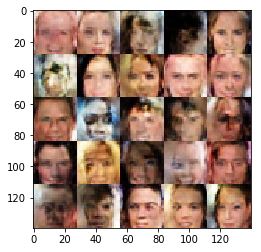

Epoch 1/1... Discriminator Loss: 1.1675... Generator Loss: 1.9544
Epoch 1/1... Discriminator Loss: 0.8766... Generator Loss: 0.9594
Epoch 1/1... Discriminator Loss: 1.4791... Generator Loss: 0.5562
Epoch 1/1... Discriminator Loss: 1.4196... Generator Loss: 1.1525
Epoch 1/1... Discriminator Loss: 1.3419... Generator Loss: 0.8527


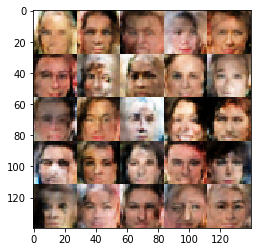

Epoch 1/1... Discriminator Loss: 1.1377... Generator Loss: 1.3483
Epoch 1/1... Discriminator Loss: 1.2502... Generator Loss: 1.0612
Epoch 1/1... Discriminator Loss: 1.0157... Generator Loss: 0.8449
Epoch 1/1... Discriminator Loss: 1.0497... Generator Loss: 1.2302
Epoch 1/1... Discriminator Loss: 1.2689... Generator Loss: 1.2001


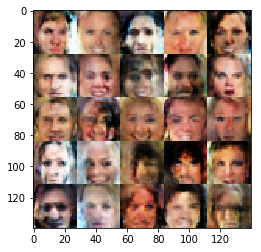

Epoch 1/1... Discriminator Loss: 1.0801... Generator Loss: 1.2915
Epoch 1/1... Discriminator Loss: 1.1760... Generator Loss: 1.4527
Epoch 1/1... Discriminator Loss: 1.0735... Generator Loss: 0.7913
Epoch 1/1... Discriminator Loss: 1.0844... Generator Loss: 1.3768
Epoch 1/1... Discriminator Loss: 1.2561... Generator Loss: 0.9963


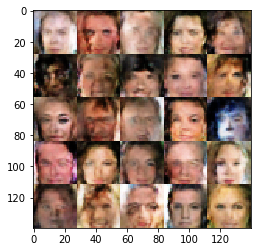

Epoch 1/1... Discriminator Loss: 1.2440... Generator Loss: 0.9425
Epoch 1/1... Discriminator Loss: 1.0560... Generator Loss: 1.1575
Epoch 1/1... Discriminator Loss: 1.2057... Generator Loss: 1.6295
Epoch 1/1... Discriminator Loss: 1.1624... Generator Loss: 1.5021
Epoch 1/1... Discriminator Loss: 1.0804... Generator Loss: 1.0569


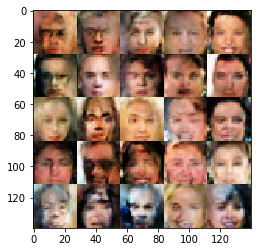

Epoch 1/1... Discriminator Loss: 1.0931... Generator Loss: 0.9718
Epoch 1/1... Discriminator Loss: 1.2093... Generator Loss: 0.8896
Epoch 1/1... Discriminator Loss: 1.2088... Generator Loss: 1.8081
Epoch 1/1... Discriminator Loss: 1.2038... Generator Loss: 1.1972
Epoch 1/1... Discriminator Loss: 1.1870... Generator Loss: 0.7426


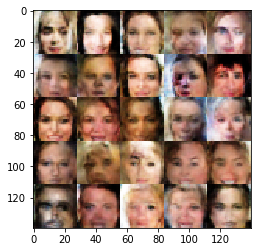

Epoch 1/1... Discriminator Loss: 1.1051... Generator Loss: 0.7722
Epoch 1/1... Discriminator Loss: 1.1395... Generator Loss: 1.1153
Epoch 1/1... Discriminator Loss: 1.0040... Generator Loss: 1.2266
Epoch 1/1... Discriminator Loss: 1.2777... Generator Loss: 0.7646
Epoch 1/1... Discriminator Loss: 1.1376... Generator Loss: 1.2177


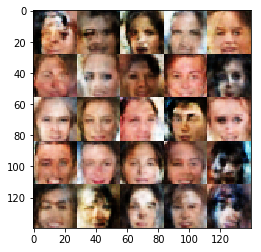

Epoch 1/1... Discriminator Loss: 1.0580... Generator Loss: 1.2055
Epoch 1/1... Discriminator Loss: 1.2837... Generator Loss: 1.6092
Epoch 1/1... Discriminator Loss: 1.0363... Generator Loss: 1.2494
Epoch 1/1... Discriminator Loss: 1.0933... Generator Loss: 1.4684
Epoch 1/1... Discriminator Loss: 1.0397... Generator Loss: 0.9731


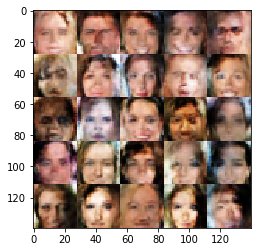

Epoch 1/1... Discriminator Loss: 1.1955... Generator Loss: 0.6825
Epoch 1/1... Discriminator Loss: 1.3041... Generator Loss: 0.6802
Epoch 1/1... Discriminator Loss: 1.1533... Generator Loss: 1.0303
Epoch 1/1... Discriminator Loss: 1.1353... Generator Loss: 1.3688
Epoch 1/1... Discriminator Loss: 1.1905... Generator Loss: 1.3567


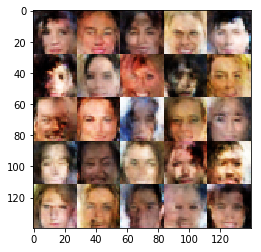

Epoch 1/1... Discriminator Loss: 1.4240... Generator Loss: 0.4782
Epoch 1/1... Discriminator Loss: 1.1397... Generator Loss: 1.4984
Epoch 1/1... Discriminator Loss: 1.0494... Generator Loss: 1.2632
Epoch 1/1... Discriminator Loss: 1.0254... Generator Loss: 1.0866
Epoch 1/1... Discriminator Loss: 0.9362... Generator Loss: 1.1139


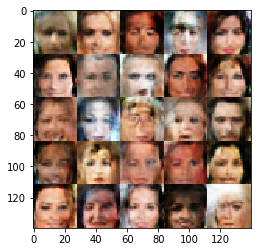

Epoch 1/1... Discriminator Loss: 1.1534... Generator Loss: 1.3773
Epoch 1/1... Discriminator Loss: 1.1606... Generator Loss: 0.6309
Epoch 1/1... Discriminator Loss: 1.0349... Generator Loss: 1.1903
Epoch 1/1... Discriminator Loss: 1.0883... Generator Loss: 1.1700
Epoch 1/1... Discriminator Loss: 1.0867... Generator Loss: 0.8659


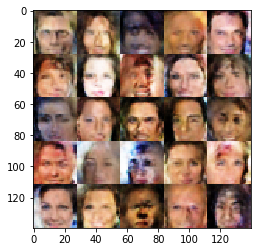

Epoch 1/1... Discriminator Loss: 0.9721... Generator Loss: 1.4065
Epoch 1/1... Discriminator Loss: 1.0797... Generator Loss: 1.0350
Epoch 1/1... Discriminator Loss: 1.2357... Generator Loss: 1.2871
Epoch 1/1... Discriminator Loss: 1.1774... Generator Loss: 2.1300
Epoch 1/1... Discriminator Loss: 1.1204... Generator Loss: 1.3880


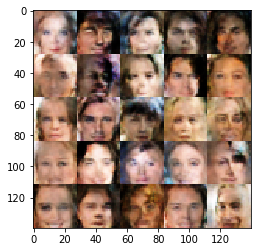

Epoch 1/1... Discriminator Loss: 1.0963... Generator Loss: 0.8263
Epoch 1/1... Discriminator Loss: 1.3923... Generator Loss: 0.8829
Epoch 1/1... Discriminator Loss: 1.0586... Generator Loss: 1.1470
Epoch 1/1... Discriminator Loss: 0.9570... Generator Loss: 0.9768
Epoch 1/1... Discriminator Loss: 1.3715... Generator Loss: 1.3804


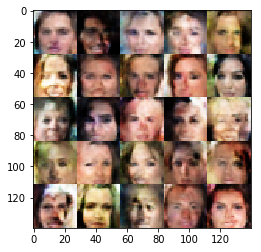

Epoch 1/1... Discriminator Loss: 1.2454... Generator Loss: 1.3719
Epoch 1/1... Discriminator Loss: 1.1973... Generator Loss: 0.9626
Epoch 1/1... Discriminator Loss: 1.1598... Generator Loss: 0.9721
Epoch 1/1... Discriminator Loss: 1.1155... Generator Loss: 1.6906
Epoch 1/1... Discriminator Loss: 1.3059... Generator Loss: 1.2237


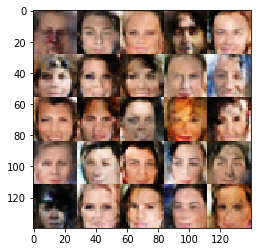

Epoch 1/1... Discriminator Loss: 1.0268... Generator Loss: 1.0554
Epoch 1/1... Discriminator Loss: 1.4269... Generator Loss: 0.6492
Epoch 1/1... Discriminator Loss: 1.0139... Generator Loss: 1.4085
Epoch 1/1... Discriminator Loss: 1.0771... Generator Loss: 1.1365
Epoch 1/1... Discriminator Loss: 1.1691... Generator Loss: 1.8978


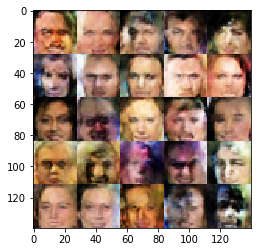

Epoch 1/1... Discriminator Loss: 1.1612... Generator Loss: 0.8161
Epoch 1/1... Discriminator Loss: 1.2182... Generator Loss: 0.5991
Epoch 1/1... Discriminator Loss: 1.1354... Generator Loss: 1.5250
Epoch 1/1... Discriminator Loss: 1.0601... Generator Loss: 1.2597
Epoch 1/1... Discriminator Loss: 1.0002... Generator Loss: 1.7508


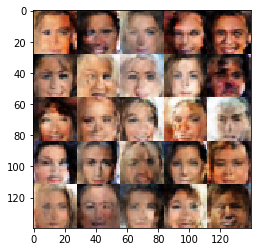

Epoch 1/1... Discriminator Loss: 1.1022... Generator Loss: 0.9051
Epoch 1/1... Discriminator Loss: 1.0948... Generator Loss: 0.8049
Epoch 1/1... Discriminator Loss: 0.9950... Generator Loss: 1.4567
Epoch 1/1... Discriminator Loss: 1.0750... Generator Loss: 0.9875
Epoch 1/1... Discriminator Loss: 1.1850... Generator Loss: 0.8422


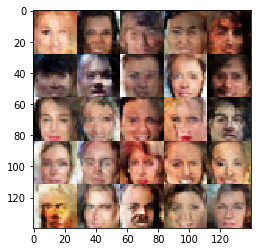

Epoch 1/1... Discriminator Loss: 1.1830... Generator Loss: 1.4924
Epoch 1/1... Discriminator Loss: 0.9715... Generator Loss: 0.9400
Epoch 1/1... Discriminator Loss: 1.1603... Generator Loss: 1.1047
Epoch 1/1... Discriminator Loss: 0.8861... Generator Loss: 1.0805
Epoch 1/1... Discriminator Loss: 1.0481... Generator Loss: 1.1823


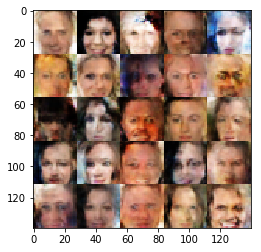

Epoch 1/1... Discriminator Loss: 1.1494... Generator Loss: 0.8642
Epoch 1/1... Discriminator Loss: 1.1367... Generator Loss: 1.4296
Epoch 1/1... Discriminator Loss: 1.2453... Generator Loss: 0.8089
Epoch 1/1... Discriminator Loss: 1.2670... Generator Loss: 0.7783
Epoch 1/1... Discriminator Loss: 0.9982... Generator Loss: 1.3638


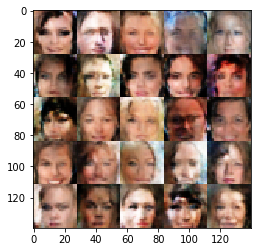

Epoch 1/1... Discriminator Loss: 1.2187... Generator Loss: 1.1732
Epoch 1/1... Discriminator Loss: 1.0957... Generator Loss: 1.4933
Epoch 1/1... Discriminator Loss: 0.9652... Generator Loss: 1.1952
Epoch 1/1... Discriminator Loss: 1.1156... Generator Loss: 1.1073
Epoch 1/1... Discriminator Loss: 1.1545... Generator Loss: 0.9846


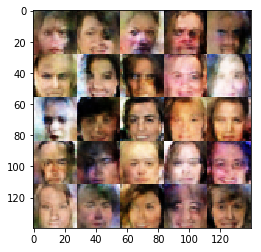

Epoch 1/1... Discriminator Loss: 1.1359... Generator Loss: 1.1844
Epoch 1/1... Discriminator Loss: 1.1726... Generator Loss: 1.2827
Epoch 1/1... Discriminator Loss: 1.1558... Generator Loss: 1.3125
Epoch 1/1... Discriminator Loss: 1.0071... Generator Loss: 0.8814
Epoch 1/1... Discriminator Loss: 1.1100... Generator Loss: 1.1322


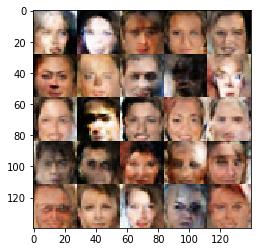

Epoch 1/1... Discriminator Loss: 1.0306... Generator Loss: 1.0447
Epoch 1/1... Discriminator Loss: 1.1024... Generator Loss: 1.1786
Epoch 1/1... Discriminator Loss: 0.9280... Generator Loss: 1.5590
Epoch 1/1... Discriminator Loss: 1.1820... Generator Loss: 0.8646
Epoch 1/1... Discriminator Loss: 1.0796... Generator Loss: 1.5535


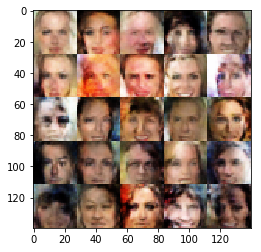

Epoch 1/1... Discriminator Loss: 0.9386... Generator Loss: 1.5128
Epoch 1/1... Discriminator Loss: 1.5073... Generator Loss: 0.7438
Epoch 1/1... Discriminator Loss: 1.1407... Generator Loss: 0.9239
Epoch 1/1... Discriminator Loss: 1.3607... Generator Loss: 0.7315
Epoch 1/1... Discriminator Loss: 1.2376... Generator Loss: 1.1985


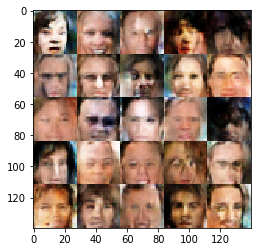

Epoch 1/1... Discriminator Loss: 1.1269... Generator Loss: 0.7516
Epoch 1/1... Discriminator Loss: 1.0947... Generator Loss: 1.5344
Epoch 1/1... Discriminator Loss: 1.2366... Generator Loss: 0.7859
Epoch 1/1... Discriminator Loss: 1.1768... Generator Loss: 1.0853
Epoch 1/1... Discriminator Loss: 0.9804... Generator Loss: 1.5918


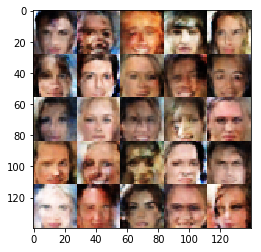

Epoch 1/1... Discriminator Loss: 1.0043... Generator Loss: 0.7316
Epoch 1/1... Discriminator Loss: 0.9330... Generator Loss: 1.3423
Epoch 1/1... Discriminator Loss: 1.0682... Generator Loss: 0.6208
Epoch 1/1... Discriminator Loss: 1.0221... Generator Loss: 1.1095
Epoch 1/1... Discriminator Loss: 1.1569... Generator Loss: 1.5962


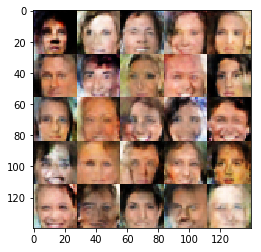

Epoch 1/1... Discriminator Loss: 1.2408... Generator Loss: 0.7966
Epoch 1/1... Discriminator Loss: 1.0228... Generator Loss: 0.7324
Epoch 1/1... Discriminator Loss: 1.2484... Generator Loss: 0.7686
Epoch 1/1... Discriminator Loss: 1.1959... Generator Loss: 1.3611
Epoch 1/1... Discriminator Loss: 1.1060... Generator Loss: 1.3045


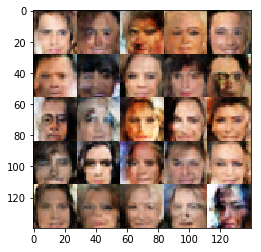

Epoch 1/1... Discriminator Loss: 1.1342... Generator Loss: 1.0869
Epoch 1/1... Discriminator Loss: 1.0943... Generator Loss: 1.4773
Epoch 1/1... Discriminator Loss: 1.0498... Generator Loss: 0.8947
Epoch 1/1... Discriminator Loss: 1.1593... Generator Loss: 0.7596
Epoch 1/1... Discriminator Loss: 1.0451... Generator Loss: 1.2788


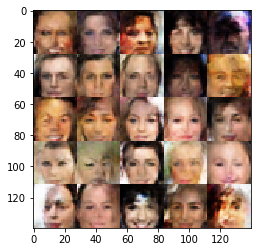

Epoch 1/1... Discriminator Loss: 0.8753... Generator Loss: 1.2864
Epoch 1/1... Discriminator Loss: 1.2792... Generator Loss: 0.7811
Epoch 1/1... Discriminator Loss: 1.3239... Generator Loss: 0.8394
Epoch 1/1... Discriminator Loss: 1.0882... Generator Loss: 1.1844
Epoch 1/1... Discriminator Loss: 1.2141... Generator Loss: 0.7136


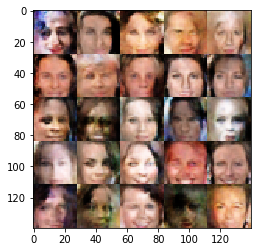

Epoch 1/1... Discriminator Loss: 1.1433... Generator Loss: 1.1874
Epoch 1/1... Discriminator Loss: 1.0417... Generator Loss: 1.0806
Epoch 1/1... Discriminator Loss: 1.2244... Generator Loss: 0.9140
Epoch 1/1... Discriminator Loss: 1.3953... Generator Loss: 0.5649
Epoch 1/1... Discriminator Loss: 0.9876... Generator Loss: 0.9539


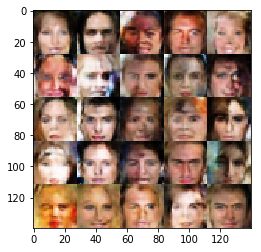

Epoch 1/1... Discriminator Loss: 1.1692... Generator Loss: 0.8240
Epoch 1/1... Discriminator Loss: 1.1879... Generator Loss: 0.8604
Epoch 1/1... Discriminator Loss: 1.2972... Generator Loss: 0.7073
Epoch 1/1... Discriminator Loss: 1.0206... Generator Loss: 1.0402
Epoch 1/1... Discriminator Loss: 1.0670... Generator Loss: 0.9428


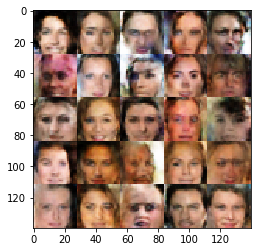

Epoch 1/1... Discriminator Loss: 1.1352... Generator Loss: 1.5204
Epoch 1/1... Discriminator Loss: 1.4044... Generator Loss: 1.1871
Epoch 1/1... Discriminator Loss: 1.1541... Generator Loss: 1.1773
Epoch 1/1... Discriminator Loss: 1.1055... Generator Loss: 1.5260
Epoch 1/1... Discriminator Loss: 1.0646... Generator Loss: 1.2483


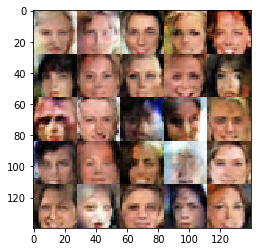

Epoch 1/1... Discriminator Loss: 1.0603... Generator Loss: 0.8527
Epoch 1/1... Discriminator Loss: 0.9590... Generator Loss: 1.2820
Epoch 1/1... Discriminator Loss: 0.9750... Generator Loss: 1.4113
Epoch 1/1... Discriminator Loss: 1.1208... Generator Loss: 0.8590
Epoch 1/1... Discriminator Loss: 1.1638... Generator Loss: 0.8857


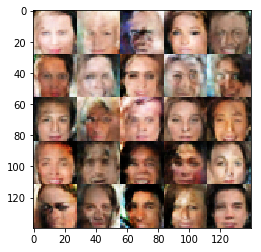

Epoch 1/1... Discriminator Loss: 1.1346... Generator Loss: 1.0910
Epoch 1/1... Discriminator Loss: 1.3612... Generator Loss: 0.8239
Epoch 1/1... Discriminator Loss: 1.0009... Generator Loss: 0.9203
Epoch 1/1... Discriminator Loss: 1.0191... Generator Loss: 1.7172
Epoch 1/1... Discriminator Loss: 1.2032... Generator Loss: 0.9615


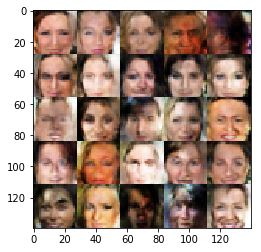

Epoch 1/1... Discriminator Loss: 1.0600... Generator Loss: 1.4504
Epoch 1/1... Discriminator Loss: 1.2232... Generator Loss: 0.7524
Epoch 1/1... Discriminator Loss: 1.1170... Generator Loss: 0.9183
Epoch 1/1... Discriminator Loss: 1.1888... Generator Loss: 1.6878
Epoch 1/1... Discriminator Loss: 1.3046... Generator Loss: 0.9553


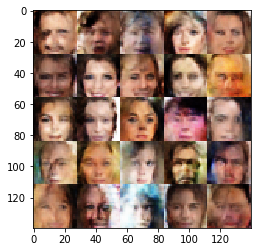

Epoch 1/1... Discriminator Loss: 0.9649... Generator Loss: 1.0286
Epoch 1/1... Discriminator Loss: 1.0267... Generator Loss: 1.4245
Epoch 1/1... Discriminator Loss: 1.0818... Generator Loss: 1.2646
Epoch 1/1... Discriminator Loss: 0.9336... Generator Loss: 1.2586
Epoch 1/1... Discriminator Loss: 1.2923... Generator Loss: 0.8699


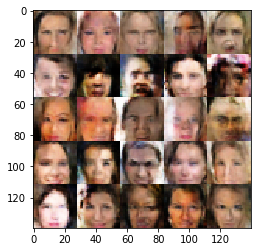

Epoch 1/1... Discriminator Loss: 1.0360... Generator Loss: 1.0328
Epoch 1/1... Discriminator Loss: 1.2136... Generator Loss: 1.1823
Epoch 1/1... Discriminator Loss: 1.0398... Generator Loss: 0.9987
Epoch 1/1... Discriminator Loss: 1.1626... Generator Loss: 0.9740
Epoch 1/1... Discriminator Loss: 1.1137... Generator Loss: 1.2363


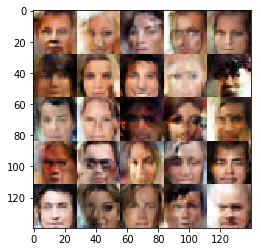

Epoch 1/1... Discriminator Loss: 1.2374... Generator Loss: 0.8672
Epoch 1/1... Discriminator Loss: 1.2085... Generator Loss: 1.3334
Epoch 1/1... Discriminator Loss: 1.1221... Generator Loss: 1.3177
Epoch 1/1... Discriminator Loss: 1.0547... Generator Loss: 1.2236
Epoch 1/1... Discriminator Loss: 1.2923... Generator Loss: 0.6785


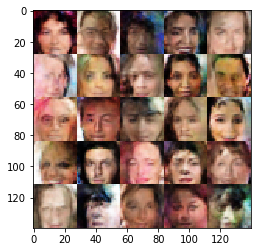

Epoch 1/1... Discriminator Loss: 1.1729... Generator Loss: 0.9524
Epoch 1/1... Discriminator Loss: 1.2015... Generator Loss: 0.9251
Epoch 1/1... Discriminator Loss: 1.1568... Generator Loss: 1.0974
Epoch 1/1... Discriminator Loss: 1.2215... Generator Loss: 0.9277
Epoch 1/1... Discriminator Loss: 1.4298... Generator Loss: 0.6492


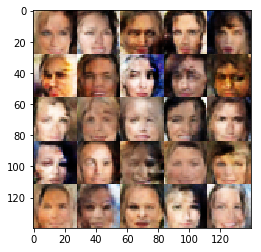

Epoch 1/1... Discriminator Loss: 1.2499... Generator Loss: 1.1833
Epoch 1/1... Discriminator Loss: 1.1991... Generator Loss: 1.1556
Epoch 1/1... Discriminator Loss: 1.0792... Generator Loss: 1.4542
Epoch 1/1... Discriminator Loss: 1.1497... Generator Loss: 1.1963
Epoch 1/1... Discriminator Loss: 1.1522... Generator Loss: 1.2467


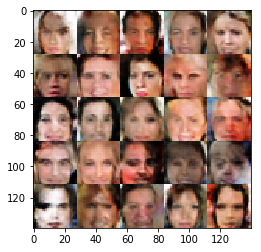

Epoch 1/1... Discriminator Loss: 1.2830... Generator Loss: 1.2117
Epoch 1/1... Discriminator Loss: 1.0958... Generator Loss: 1.1037
Epoch 1/1... Discriminator Loss: 1.1846... Generator Loss: 0.8942
Epoch 1/1... Discriminator Loss: 1.1750... Generator Loss: 0.9643
Epoch 1/1... Discriminator Loss: 1.2251... Generator Loss: 1.4238


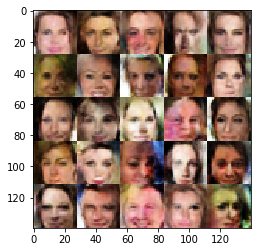

Epoch 1/1... Discriminator Loss: 1.1166... Generator Loss: 1.4536
Epoch 1/1... Discriminator Loss: 1.1806... Generator Loss: 1.2906
Epoch 1/1... Discriminator Loss: 1.3041... Generator Loss: 0.7072
Epoch 1/1... Discriminator Loss: 1.2292... Generator Loss: 1.0103
Epoch 1/1... Discriminator Loss: 1.2288... Generator Loss: 0.7355


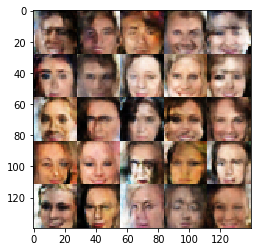

Epoch 1/1... Discriminator Loss: 1.2271... Generator Loss: 1.5352
Epoch 1/1... Discriminator Loss: 1.0633... Generator Loss: 1.1642
Epoch 1/1... Discriminator Loss: 1.0965... Generator Loss: 0.8469
Epoch 1/1... Discriminator Loss: 1.1114... Generator Loss: 1.1363
Epoch 1/1... Discriminator Loss: 1.2720... Generator Loss: 0.6803


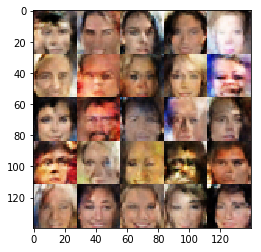

Epoch 1/1... Discriminator Loss: 1.1282... Generator Loss: 0.8370
Epoch 1/1... Discriminator Loss: 1.0909... Generator Loss: 1.3451
Epoch 1/1... Discriminator Loss: 1.3068... Generator Loss: 1.3761
Epoch 1/1... Discriminator Loss: 1.1163... Generator Loss: 0.9274
Epoch 1/1... Discriminator Loss: 1.2435... Generator Loss: 0.8894


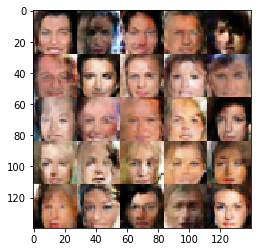

Epoch 1/1... Discriminator Loss: 1.0193... Generator Loss: 1.0852
Epoch 1/1... Discriminator Loss: 0.9946... Generator Loss: 1.4289
Epoch 1/1... Discriminator Loss: 1.2495... Generator Loss: 1.2093
Epoch 1/1... Discriminator Loss: 1.0547... Generator Loss: 0.9754
Epoch 1/1... Discriminator Loss: 1.1453... Generator Loss: 1.5832


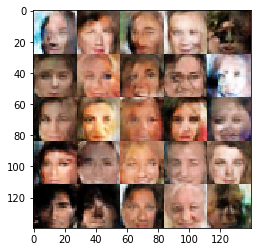

Epoch 1/1... Discriminator Loss: 1.1996... Generator Loss: 1.8018
Epoch 1/1... Discriminator Loss: 0.9336... Generator Loss: 1.1791
Epoch 1/1... Discriminator Loss: 1.0149... Generator Loss: 1.2127
Epoch 1/1... Discriminator Loss: 1.1862... Generator Loss: 1.0895
Epoch 1/1... Discriminator Loss: 1.1521... Generator Loss: 1.5733


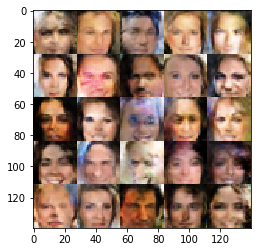

Epoch 1/1... Discriminator Loss: 1.0974... Generator Loss: 1.2205
Epoch 1/1... Discriminator Loss: 1.1128... Generator Loss: 1.1809
Epoch 1/1... Discriminator Loss: 1.1067... Generator Loss: 1.1519
Epoch 1/1... Discriminator Loss: 1.0278... Generator Loss: 1.0972
Epoch 1/1... Discriminator Loss: 1.0402... Generator Loss: 1.1154


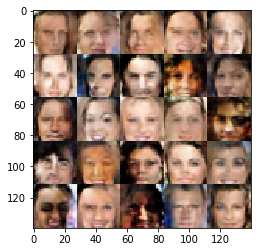

Epoch 1/1... Discriminator Loss: 1.2860... Generator Loss: 1.4114
Epoch 1/1... Discriminator Loss: 1.1256... Generator Loss: 0.7994
Epoch 1/1... Discriminator Loss: 1.1457... Generator Loss: 0.9228
Epoch 1/1... Discriminator Loss: 0.9742... Generator Loss: 1.3513
Epoch 1/1... Discriminator Loss: 1.0649... Generator Loss: 1.3726


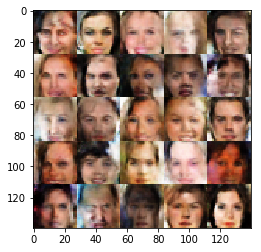

Epoch 1/1... Discriminator Loss: 1.3215... Generator Loss: 1.6590
Epoch 1/1... Discriminator Loss: 1.0755... Generator Loss: 1.2658
Epoch 1/1... Discriminator Loss: 1.1702... Generator Loss: 1.0553
Epoch 1/1... Discriminator Loss: 1.0319... Generator Loss: 1.0950
Epoch 1/1... Discriminator Loss: 1.1565... Generator Loss: 1.1355


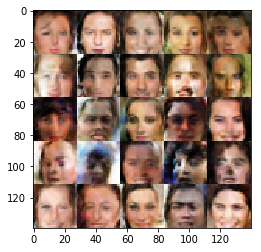

Epoch 1/1... Discriminator Loss: 1.1744... Generator Loss: 1.4030
Epoch 1/1... Discriminator Loss: 1.0976... Generator Loss: 0.9766
Epoch 1/1... Discriminator Loss: 1.0353... Generator Loss: 1.1902
Epoch 1/1... Discriminator Loss: 1.0120... Generator Loss: 1.1952
Epoch 1/1... Discriminator Loss: 1.0987... Generator Loss: 0.8601


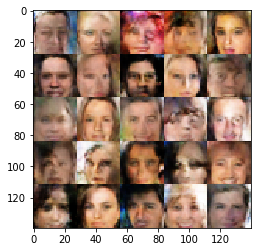

Epoch 1/1... Discriminator Loss: 1.1691... Generator Loss: 2.4014
Epoch 1/1... Discriminator Loss: 1.1728... Generator Loss: 1.3238
Epoch 1/1... Discriminator Loss: 1.1069... Generator Loss: 0.8487
Epoch 1/1... Discriminator Loss: 0.8045... Generator Loss: 1.2531
Epoch 1/1... Discriminator Loss: 1.1707... Generator Loss: 1.4799


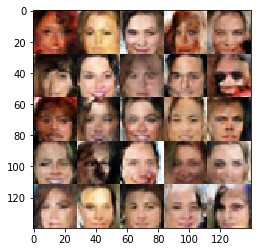

Epoch 1/1... Discriminator Loss: 1.1096... Generator Loss: 0.9170
Epoch 1/1... Discriminator Loss: 0.9393... Generator Loss: 1.1157
Epoch 1/1... Discriminator Loss: 0.9905... Generator Loss: 1.1257
Epoch 1/1... Discriminator Loss: 1.1779... Generator Loss: 1.0680
Epoch 1/1... Discriminator Loss: 0.9587... Generator Loss: 1.4788


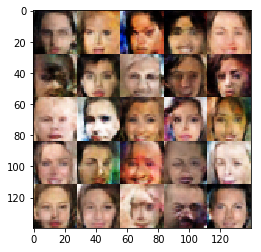

Epoch 1/1... Discriminator Loss: 1.1438... Generator Loss: 0.6543
Epoch 1/1... Discriminator Loss: 0.9053... Generator Loss: 1.4591
Epoch 1/1... Discriminator Loss: 1.2416... Generator Loss: 1.7314
Epoch 1/1... Discriminator Loss: 1.0455... Generator Loss: 1.0992
Epoch 1/1... Discriminator Loss: 1.3666... Generator Loss: 0.4179


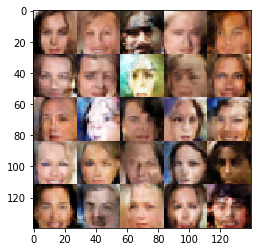

Epoch 1/1... Discriminator Loss: 1.3251... Generator Loss: 0.7884
Epoch 1/1... Discriminator Loss: 1.0000... Generator Loss: 1.2425
Epoch 1/1... Discriminator Loss: 1.0048... Generator Loss: 1.1863
Epoch 1/1... Discriminator Loss: 1.0645... Generator Loss: 1.5745
Epoch 1/1... Discriminator Loss: 1.4255... Generator Loss: 0.9403


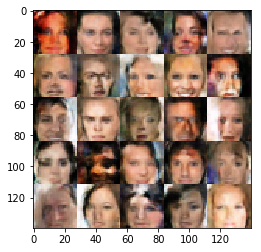

Epoch 1/1... Discriminator Loss: 1.0296... Generator Loss: 0.8969
Epoch 1/1... Discriminator Loss: 0.8715... Generator Loss: 1.1621
Epoch 1/1... Discriminator Loss: 1.0958... Generator Loss: 0.9424
Epoch 1/1... Discriminator Loss: 0.9287... Generator Loss: 1.0810
Epoch 1/1... Discriminator Loss: 0.9981... Generator Loss: 1.7183


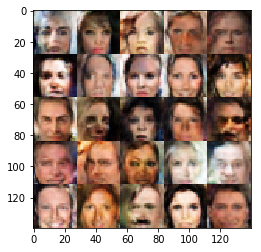

Epoch 1/1... Discriminator Loss: 1.0841... Generator Loss: 0.8915
Epoch 1/1... Discriminator Loss: 1.2597... Generator Loss: 1.3348
Epoch 1/1... Discriminator Loss: 1.0526... Generator Loss: 1.2564
Epoch 1/1... Discriminator Loss: 1.2775... Generator Loss: 1.2356
Epoch 1/1... Discriminator Loss: 1.1272... Generator Loss: 1.4143


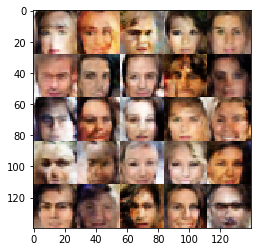

Epoch 1/1... Discriminator Loss: 1.2366... Generator Loss: 0.9907
Epoch 1/1... Discriminator Loss: 1.1860... Generator Loss: 1.1482
Epoch 1/1... Discriminator Loss: 0.8452... Generator Loss: 0.8883
Epoch 1/1... Discriminator Loss: 0.8129... Generator Loss: 1.2619
Epoch 1/1... Discriminator Loss: 1.0693... Generator Loss: 1.1222


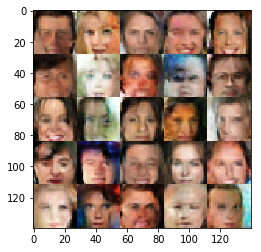

Epoch 1/1... Discriminator Loss: 1.3498... Generator Loss: 0.5932
Epoch 1/1... Discriminator Loss: 1.0070... Generator Loss: 1.2963
Epoch 1/1... Discriminator Loss: 1.1942... Generator Loss: 0.7445
Epoch 1/1... Discriminator Loss: 1.0646... Generator Loss: 1.8396
Epoch 1/1... Discriminator Loss: 1.1073... Generator Loss: 1.1550


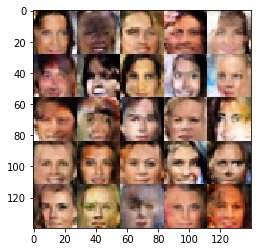

Epoch 1/1... Discriminator Loss: 1.2417... Generator Loss: 0.6396
Epoch 1/1... Discriminator Loss: 1.1416... Generator Loss: 0.9457
Epoch 1/1... Discriminator Loss: 1.1117... Generator Loss: 1.1665
Epoch 1/1... Discriminator Loss: 1.3218... Generator Loss: 0.8538
Epoch 1/1... Discriminator Loss: 1.1917... Generator Loss: 0.8346


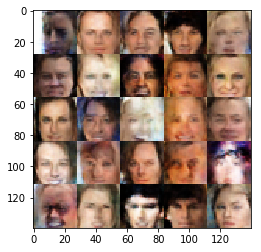

Epoch 1/1... Discriminator Loss: 1.0552... Generator Loss: 0.8771
Epoch 1/1... Discriminator Loss: 1.1459... Generator Loss: 1.1708
Epoch 1/1... Discriminator Loss: 1.0752... Generator Loss: 1.5184
Epoch 1/1... Discriminator Loss: 1.1586... Generator Loss: 1.1986
Epoch 1/1... Discriminator Loss: 1.0909... Generator Loss: 0.9383


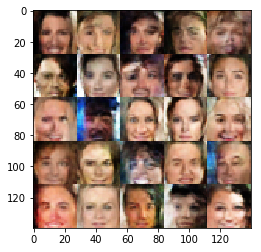

Epoch 1/1... Discriminator Loss: 1.1998... Generator Loss: 1.0349
Epoch 1/1... Discriminator Loss: 1.2426... Generator Loss: 0.9421
Epoch 1/1... Discriminator Loss: 1.1472... Generator Loss: 0.8628
Epoch 1/1... Discriminator Loss: 1.0840... Generator Loss: 1.3847
Epoch 1/1... Discriminator Loss: 1.1687... Generator Loss: 1.0331


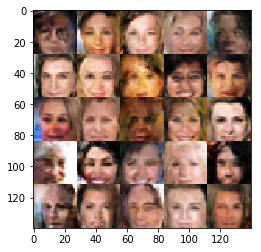

Epoch 1/1... Discriminator Loss: 1.0096... Generator Loss: 1.4415
Epoch 1/1... Discriminator Loss: 0.9316... Generator Loss: 1.2213
Epoch 1/1... Discriminator Loss: 1.2092... Generator Loss: 1.3808
Epoch 1/1... Discriminator Loss: 0.9233... Generator Loss: 1.4000
Epoch 1/1... Discriminator Loss: 1.3072... Generator Loss: 0.9615


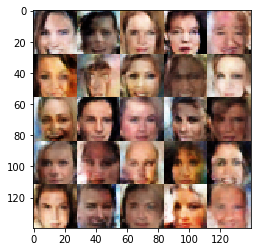

Epoch 1/1... Discriminator Loss: 1.1726... Generator Loss: 0.9667
Epoch 1/1... Discriminator Loss: 1.0037... Generator Loss: 1.0337
Epoch 1/1... Discriminator Loss: 1.1393... Generator Loss: 1.4055
Epoch 1/1... Discriminator Loss: 1.0086... Generator Loss: 1.2462
Epoch 1/1... Discriminator Loss: 1.0732... Generator Loss: 1.2895


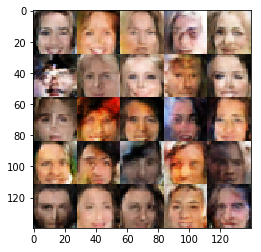

Epoch 1/1... Discriminator Loss: 1.2903... Generator Loss: 0.7015
Epoch 1/1... Discriminator Loss: 0.9673... Generator Loss: 1.0351
Epoch 1/1... Discriminator Loss: 1.0423... Generator Loss: 1.1394
Epoch 1/1... Discriminator Loss: 1.0947... Generator Loss: 1.2971
Epoch 1/1... Discriminator Loss: 0.8979... Generator Loss: 1.1240


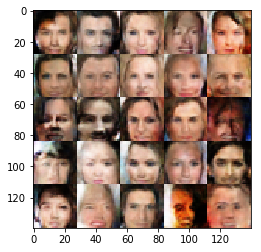

Epoch 1/1... Discriminator Loss: 1.3975... Generator Loss: 0.7501
Epoch 1/1... Discriminator Loss: 1.2811... Generator Loss: 1.6258
Epoch 1/1... Discriminator Loss: 0.9470... Generator Loss: 1.3426
Epoch 1/1... Discriminator Loss: 1.0625... Generator Loss: 1.6538
Epoch 1/1... Discriminator Loss: 1.1651... Generator Loss: 1.0817


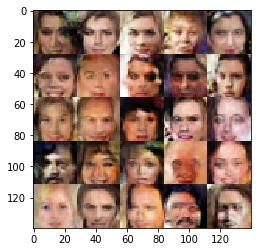

Epoch 1/1... Discriminator Loss: 1.4172... Generator Loss: 0.5905
Epoch 1/1... Discriminator Loss: 1.1563... Generator Loss: 1.0059
Epoch 1/1... Discriminator Loss: 1.2059... Generator Loss: 1.3834
Epoch 1/1... Discriminator Loss: 1.1532... Generator Loss: 1.1343
Epoch 1/1... Discriminator Loss: 1.0919... Generator Loss: 0.9588


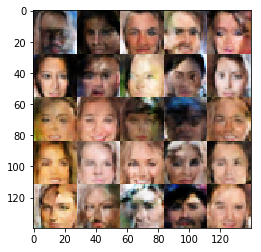

Epoch 1/1... Discriminator Loss: 1.1701... Generator Loss: 1.6514
Epoch 1/1... Discriminator Loss: 1.1736... Generator Loss: 1.5321
Epoch 1/1... Discriminator Loss: 1.2950... Generator Loss: 1.8404
Epoch 1/1... Discriminator Loss: 0.8952... Generator Loss: 1.3313
Epoch 1/1... Discriminator Loss: 0.8899... Generator Loss: 1.5100


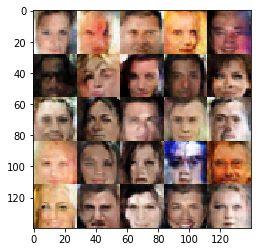

Epoch 1/1... Discriminator Loss: 1.1696... Generator Loss: 1.4181
Epoch 1/1... Discriminator Loss: 0.9989... Generator Loss: 1.3250
Epoch 1/1... Discriminator Loss: 0.9053... Generator Loss: 1.5519
Epoch 1/1... Discriminator Loss: 1.2380... Generator Loss: 0.9091
Epoch 1/1... Discriminator Loss: 1.3172... Generator Loss: 0.7223


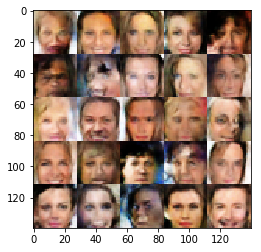

Epoch 1/1... Discriminator Loss: 1.0168... Generator Loss: 1.1115
Epoch 1/1... Discriminator Loss: 1.0056... Generator Loss: 1.5067
Epoch 1/1... Discriminator Loss: 1.1225... Generator Loss: 0.9606
Epoch 1/1... Discriminator Loss: 1.1185... Generator Loss: 1.8422
Epoch 1/1... Discriminator Loss: 1.0410... Generator Loss: 0.9903


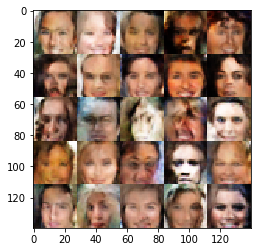

Epoch 1/1... Discriminator Loss: 0.9101... Generator Loss: 1.0826
Epoch 1/1... Discriminator Loss: 1.3007... Generator Loss: 0.8920
Epoch 1/1... Discriminator Loss: 1.1742... Generator Loss: 1.3492
Epoch 1/1... Discriminator Loss: 1.0588... Generator Loss: 0.9056
Epoch 1/1... Discriminator Loss: 1.0833... Generator Loss: 1.3624


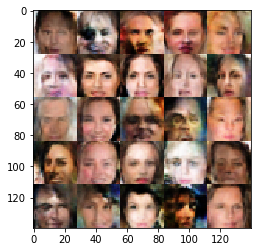

Epoch 1/1... Discriminator Loss: 1.1310... Generator Loss: 0.8843
Epoch 1/1... Discriminator Loss: 1.1943... Generator Loss: 1.3212
Epoch 1/1... Discriminator Loss: 1.2422... Generator Loss: 1.0000
Epoch 1/1... Discriminator Loss: 0.9874... Generator Loss: 1.2047
Epoch 1/1... Discriminator Loss: 1.2039... Generator Loss: 1.6774


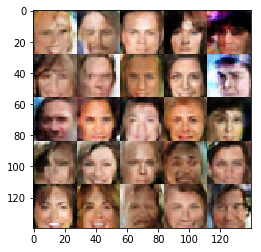

Epoch 1/1... Discriminator Loss: 1.1296... Generator Loss: 1.3051
Epoch 1/1... Discriminator Loss: 1.3004... Generator Loss: 1.3827
Epoch 1/1... Discriminator Loss: 1.0419... Generator Loss: 1.3289
Epoch 1/1... Discriminator Loss: 1.1634... Generator Loss: 0.9172
Epoch 1/1... Discriminator Loss: 1.1363... Generator Loss: 1.5807


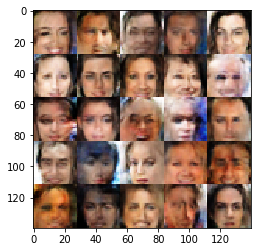

Epoch 1/1... Discriminator Loss: 1.1994... Generator Loss: 1.4725
Epoch 1/1... Discriminator Loss: 0.9880... Generator Loss: 1.5389
Epoch 1/1... Discriminator Loss: 1.1723... Generator Loss: 0.9756
Epoch 1/1... Discriminator Loss: 1.2681... Generator Loss: 0.6832
Epoch 1/1... Discriminator Loss: 0.8628... Generator Loss: 1.5543


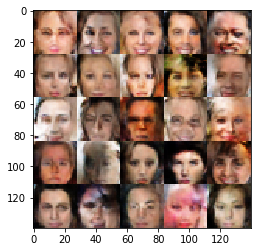

Epoch 1/1... Discriminator Loss: 1.0077... Generator Loss: 1.8836
Epoch 1/1... Discriminator Loss: 1.1747... Generator Loss: 1.5942
Epoch 1/1... Discriminator Loss: 1.1271... Generator Loss: 1.3493
Epoch 1/1... Discriminator Loss: 1.2443... Generator Loss: 0.9513
Epoch 1/1... Discriminator Loss: 1.3952... Generator Loss: 0.6770


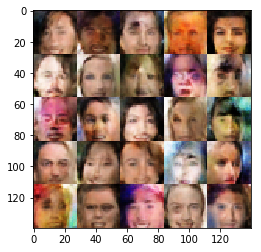

Epoch 1/1... Discriminator Loss: 1.2147... Generator Loss: 1.9879
Epoch 1/1... Discriminator Loss: 1.0219... Generator Loss: 1.1344
Epoch 1/1... Discriminator Loss: 1.3909... Generator Loss: 0.7945
Epoch 1/1... Discriminator Loss: 0.9993... Generator Loss: 1.2559
Epoch 1/1... Discriminator Loss: 1.1869... Generator Loss: 1.6215


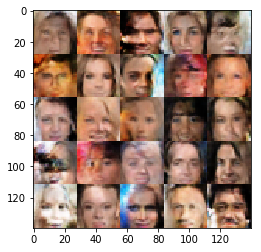

Epoch 1/1... Discriminator Loss: 1.1905... Generator Loss: 0.8401
Epoch 1/1... Discriminator Loss: 1.0740... Generator Loss: 1.2467
Epoch 1/1... Discriminator Loss: 0.9866... Generator Loss: 1.5034
Epoch 1/1... Discriminator Loss: 0.9314... Generator Loss: 1.1182
Epoch 1/1... Discriminator Loss: 1.1004... Generator Loss: 0.7577


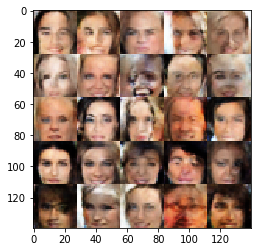

Epoch 1/1... Discriminator Loss: 1.1222... Generator Loss: 1.7430
Epoch 1/1... Discriminator Loss: 1.1309... Generator Loss: 0.6839
Epoch 1/1... Discriminator Loss: 1.2627... Generator Loss: 1.7594
Epoch 1/1... Discriminator Loss: 1.1883... Generator Loss: 0.8302
Epoch 1/1... Discriminator Loss: 1.1157... Generator Loss: 1.7514


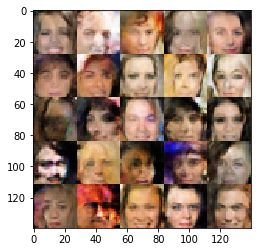

Epoch 1/1... Discriminator Loss: 1.0136... Generator Loss: 0.9649
Epoch 1/1... Discriminator Loss: 1.1054... Generator Loss: 1.3016
Epoch 1/1... Discriminator Loss: 1.1484... Generator Loss: 1.2875
Epoch 1/1... Discriminator Loss: 0.9582... Generator Loss: 1.2035
Epoch 1/1... Discriminator Loss: 1.1911... Generator Loss: 0.8586


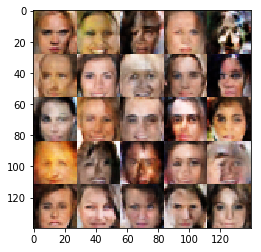

Epoch 1/1... Discriminator Loss: 1.0000... Generator Loss: 1.4357
Epoch 1/1... Discriminator Loss: 1.0349... Generator Loss: 1.2949
Epoch 1/1... Discriminator Loss: 0.9541... Generator Loss: 1.1005
Epoch 1/1... Discriminator Loss: 0.9585... Generator Loss: 1.7798
Epoch 1/1... Discriminator Loss: 1.1447... Generator Loss: 1.0863


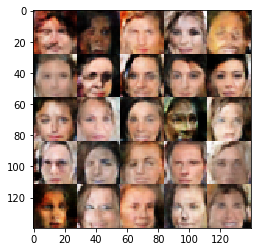

Epoch 1/1... Discriminator Loss: 1.2203... Generator Loss: 0.7589
Epoch 1/1... Discriminator Loss: 1.0538... Generator Loss: 1.2368
Epoch 1/1... Discriminator Loss: 1.0504... Generator Loss: 1.0770
Epoch 1/1... Discriminator Loss: 1.0202... Generator Loss: 0.8227
Epoch 1/1... Discriminator Loss: 1.1419... Generator Loss: 1.4620


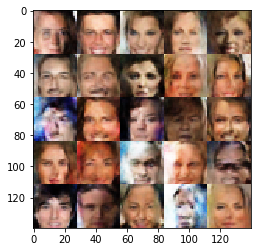

Epoch 1/1... Discriminator Loss: 1.1300... Generator Loss: 0.7609
Epoch 1/1... Discriminator Loss: 1.3239... Generator Loss: 2.0829
Epoch 1/1... Discriminator Loss: 1.0558... Generator Loss: 1.2587
Epoch 1/1... Discriminator Loss: 1.0941... Generator Loss: 1.2245
Epoch 1/1... Discriminator Loss: 1.0249... Generator Loss: 1.1713


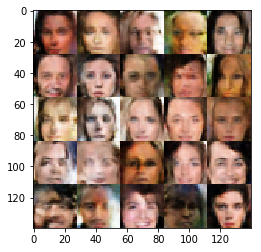

Epoch 1/1... Discriminator Loss: 1.2104... Generator Loss: 1.6740
Epoch 1/1... Discriminator Loss: 1.1671... Generator Loss: 1.3826
Epoch 1/1... Discriminator Loss: 1.1049... Generator Loss: 1.0851
Epoch 1/1... Discriminator Loss: 0.9002... Generator Loss: 1.7246
Epoch 1/1... Discriminator Loss: 0.9482... Generator Loss: 0.9916


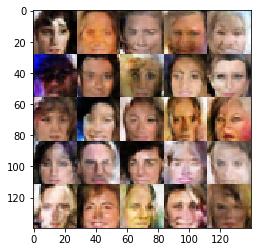

Epoch 1/1... Discriminator Loss: 1.2254... Generator Loss: 1.1355
Epoch 1/1... Discriminator Loss: 1.0891... Generator Loss: 1.0940
Epoch 1/1... Discriminator Loss: 1.2726... Generator Loss: 0.9923
Epoch 1/1... Discriminator Loss: 1.1287... Generator Loss: 0.9078
Epoch 1/1... Discriminator Loss: 1.2969... Generator Loss: 1.9893


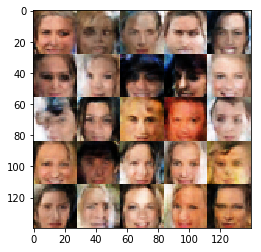

Epoch 1/1... Discriminator Loss: 1.1658... Generator Loss: 0.7967
Epoch 1/1... Discriminator Loss: 1.0713... Generator Loss: 0.9380
Epoch 1/1... Discriminator Loss: 1.0941... Generator Loss: 0.9984
Epoch 1/1... Discriminator Loss: 0.9082... Generator Loss: 0.8867
Epoch 1/1... Discriminator Loss: 1.1309... Generator Loss: 0.9191


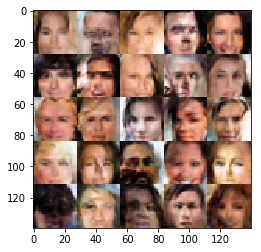

Epoch 1/1... Discriminator Loss: 1.0454... Generator Loss: 1.0583
Epoch 1/1... Discriminator Loss: 1.1191... Generator Loss: 0.8139
Epoch 1/1... Discriminator Loss: 1.2369... Generator Loss: 1.1443
Epoch 1/1... Discriminator Loss: 1.0811... Generator Loss: 1.1571
Epoch 1/1... Discriminator Loss: 1.2665... Generator Loss: 0.7247


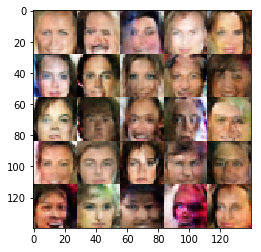

Epoch 1/1... Discriminator Loss: 1.1379... Generator Loss: 1.0194
Epoch 1/1... Discriminator Loss: 1.1660... Generator Loss: 1.2184
Epoch 1/1... Discriminator Loss: 0.9295... Generator Loss: 1.4579
Epoch 1/1... Discriminator Loss: 1.1002... Generator Loss: 1.0297
Epoch 1/1... Discriminator Loss: 1.1482... Generator Loss: 1.2028


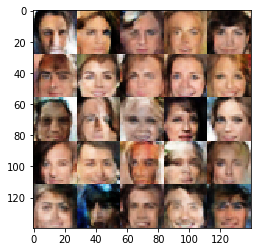

Epoch 1/1... Discriminator Loss: 1.0210... Generator Loss: 1.1737
Epoch 1/1... Discriminator Loss: 1.0649... Generator Loss: 1.1982
Epoch 1/1... Discriminator Loss: 1.0538... Generator Loss: 1.1604
Epoch 1/1... Discriminator Loss: 0.9990... Generator Loss: 2.0167
Epoch 1/1... Discriminator Loss: 1.4087... Generator Loss: 0.7061


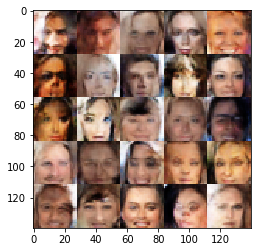

Epoch 1/1... Discriminator Loss: 1.0868... Generator Loss: 1.4198
Epoch 1/1... Discriminator Loss: 1.0680... Generator Loss: 1.4510
Epoch 1/1... Discriminator Loss: 1.0833... Generator Loss: 1.3576
Epoch 1/1... Discriminator Loss: 1.1024... Generator Loss: 0.9137
Epoch 1/1... Discriminator Loss: 0.9527... Generator Loss: 1.6244


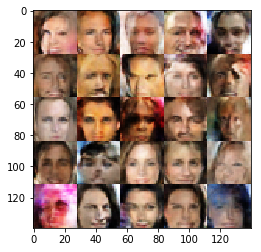

Epoch 1/1... Discriminator Loss: 0.9351... Generator Loss: 1.5594
Epoch 1/1... Discriminator Loss: 1.2126... Generator Loss: 1.0796
Epoch 1/1... Discriminator Loss: 1.2409... Generator Loss: 0.6173


In [14]:
batch_size = 16
z_dim = 150
learning_rate = 0.0002
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### 提交项目
提交本项目前，确保运行所有 cells 后保存该文件。

保存该文件为 "dlnd_face_generation.ipynb"， 并另存为 HTML 格式 "File" -> "Download as"。提交项目时请附带 "helper.py" 和 "problem_unittests.py" 文件。